In [1]:
!pip install torch numpy matplotlib pandas os

ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os


In [2]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from filtering import butter_bandpass_filter
import os

In [3]:
class ConvNet(nn.Module):
  def __init__(self):
    super().__init__()

    self.layer1 = nn.Sequential(
        nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, padding=2),
        nn.ReLU(),
        nn.MaxPool1d(5),
        nn.Dropout(p=0.1))

    self.layer2 = nn.Sequential(
        nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, padding=2),
        nn.ReLU(),
        nn.MaxPool1d(5),
        nn.Dropout(p=0.1))

    self.layer3 = nn.Sequential(
      nn.Linear(7328, 6526),
      nn.ReLU()
    )

    self.layer4 = nn.Sequential(
      nn.Linear(6526, 5725),
    )

  def forward(self, x):
    x = self.layer1(x)
    x = self.layer2(x)
    x = torch.flatten(x)
    x = self.layer3(x)
    x = self.layer4(x)

    return x

model = ConvNet() 
test_array = torch.randn(1, 5725)

print(test_array)

output = model.forward(test_array)
print(output.shape)
print(output)

tensor([[ 0.9764,  0.2952, -0.2146,  ..., -1.3962, -2.2644, -0.6981]])
torch.Size([5725])
tensor([ 0.1272,  0.0889,  0.0994,  ...,  0.1522, -0.1555, -0.1583],
       grad_fn=<ViewBackward0>)


In [4]:
def read_catalog() -> pd.DataFrame:
    df = pd.read_csv('./apollo12_catalog_GradeA_final.csv')
    return df

def find_nearest_time_index(timesteps: np.array, time: float) -> int:
    size = timesteps.shape[0]

    n = size // 2
    max = size
    min = 0
    val = 0
    while True:
        val = timesteps[n]

        if max - min <= 1:
            return n

        if time < val:
            max = n
            n = (min + max) // 2
        elif time > val:
            min = n
            n = (max + min) // 2

def one_hot_encode(size, index):
  return np.eye(size)[index]
            
def max_pool_1d(array: np.array, n: int) -> np.array:
    size = array.shape[1] // n

    if len(array) % n != 0:
        size += 1

    result = np.zeros((2, size))

    for i in range(size):
        subarr = array[:, i * n:(i * n) + n]
        max = np.max(subarr, axis=1)
        result[0, i] = max[0]
        result[1, i] = max[1]

    return result

def plot(title, ax, time, vel, line_time, predicted_time):
    ax.plot(time, vel)

    ax.set_xlim([min(time), max(time)])
    ax.set_ylabel('Velocity (m/s)')
    ax.set_xlabel('Time (s)')
    ax.set_title(f'{title}')
    arrival_line = ax.axvline(x=line_time, c='red', label='Arrival')
    predicted_line = ax.axvline(x=predicted_time, c='green', label='Model Prediction')
    ax.legend(handles=[arrival_line, predicted_line])

Predicted Time: 37645.1320754717
Actual Time: 73500.0
Predicted Index: 2493
Loss: 8.6141996383667



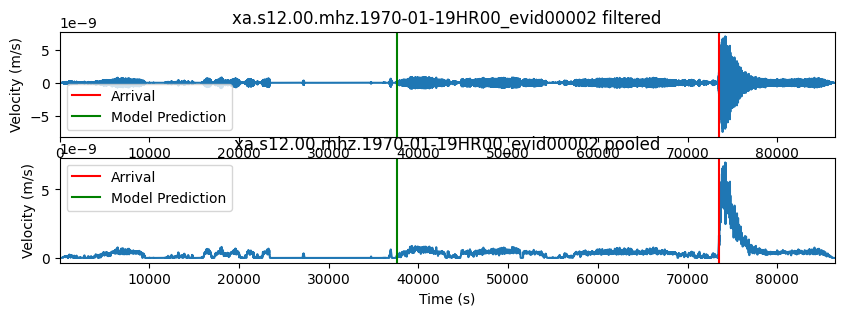

Predicted Time: 67411.16981132075
Actual Time: 12720.0
Predicted Index: 4465
Loss: 8.762969970703125



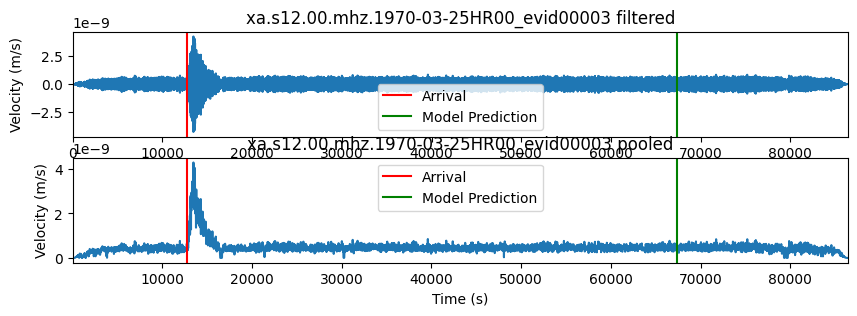

Predicted Time: 73494.18867924529
Actual Time: 73020.0
Predicted Index: 4868
Loss: 10.133720397949219



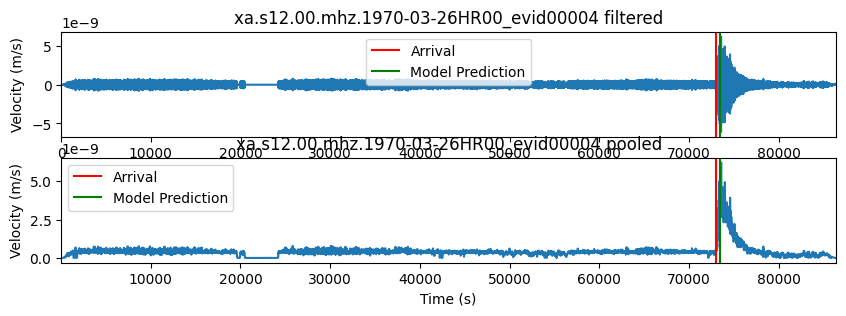

Predicted Time: 73494.18867924529
Actual Time: 4440.0
Predicted Index: 4868
Loss: 9.457315444946289



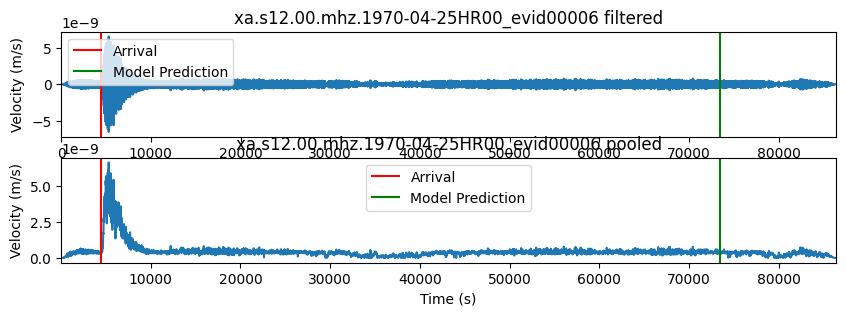

Predicted Time: 73494.18867924529
Actual Time: 52140.0
Predicted Index: 4868
Loss: 9.631714820861816



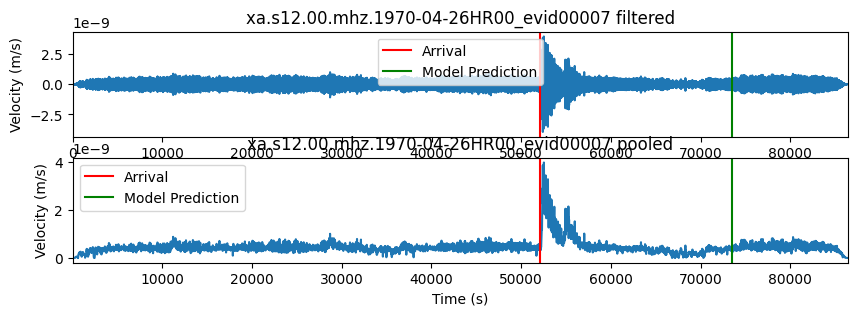

Predicted Time: 12709.283018867924
Actual Time: 68400.0
Predicted Index: 841
Loss: 9.167378425598145



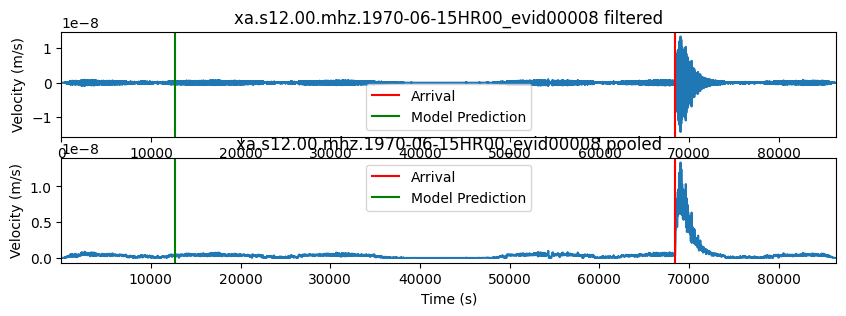

Predicted Time: 12709.283018867924
Actual Time: 72060.0
Predicted Index: 841
Loss: 9.097448348999023



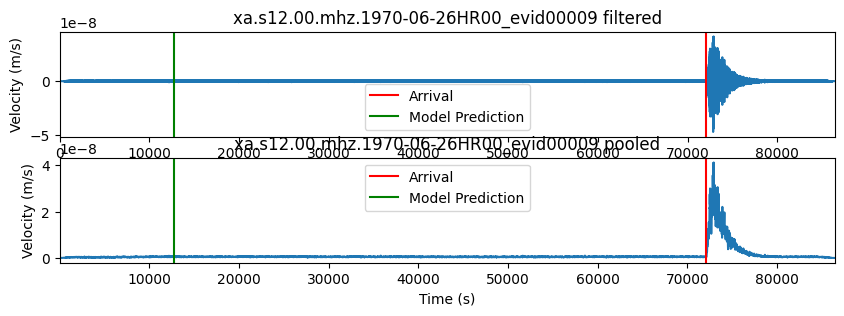

Predicted Time: 73011.16981132075
Actual Time: 18360.0
Predicted Index: 4836
Loss: 8.979297637939453



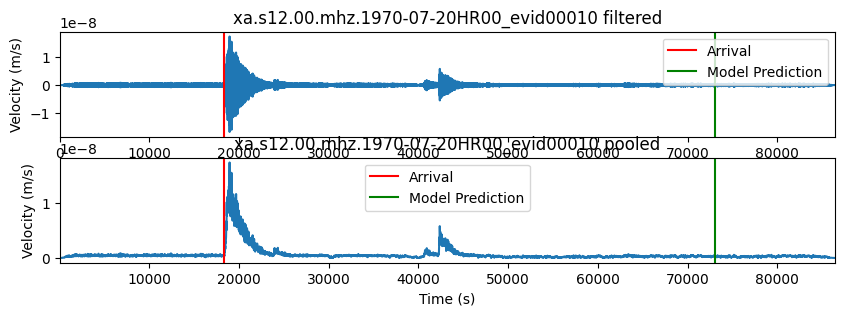

Predicted Time: 73011.16981132075
Actual Time: 42240.0
Predicted Index: 4836
Loss: 8.85463809967041



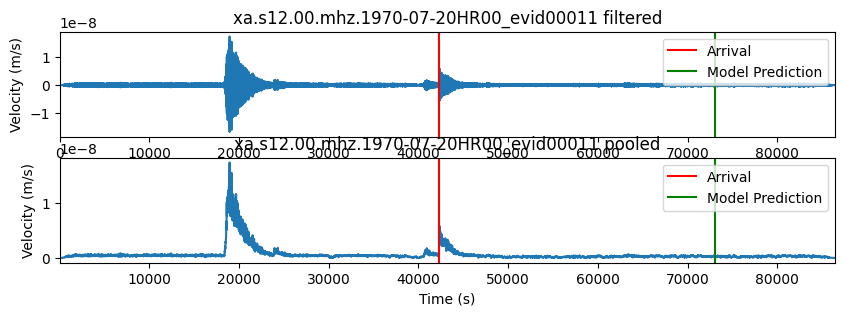

Predicted Time: 73011.16981132075
Actual Time: 71820.0
Predicted Index: 4836
Loss: 8.834345817565918



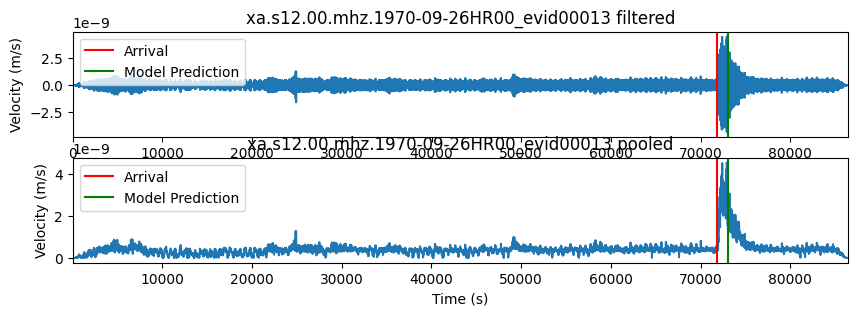

Predicted Time: 4437.584905660377
Actual Time: 41460.0
Predicted Index: 293
Loss: 8.916864395141602



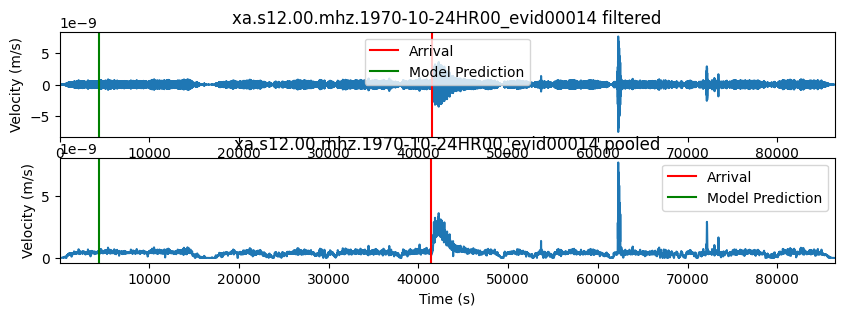

Predicted Time: 4437.584905660377
Actual Time: 46200.0
Predicted Index: 293
Loss: 8.860014915466309



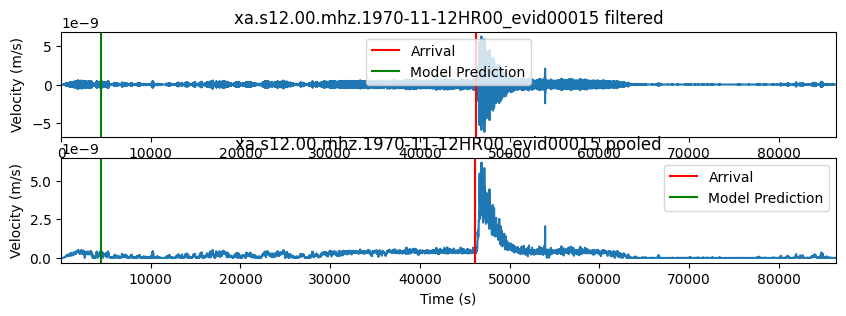

Predicted Time: 52135.698113207545
Actual Time: 26520.0
Predicted Index: 3453
Loss: 8.864498138427734



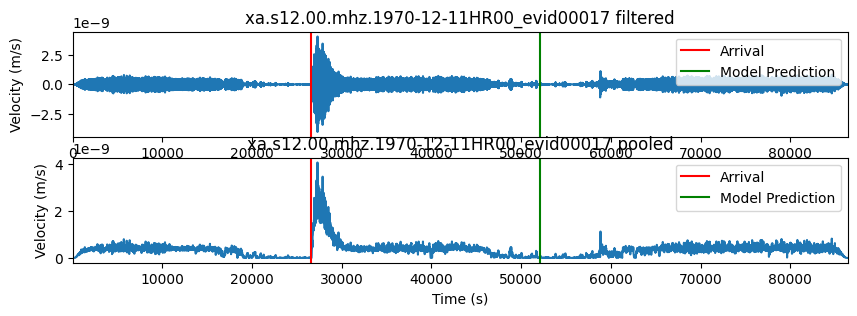

Predicted Time: 52135.698113207545
Actual Time: 74040.0
Predicted Index: 3453
Loss: 8.824112892150879



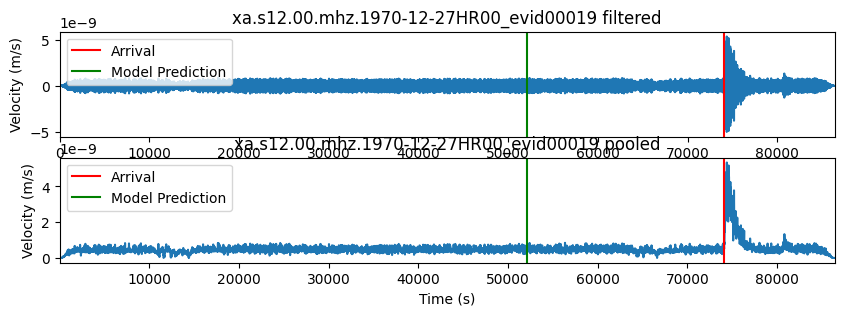

Predicted Time: 68392.30188679245
Actual Time: 56460.0
Predicted Index: 4530
Loss: 8.811161041259766



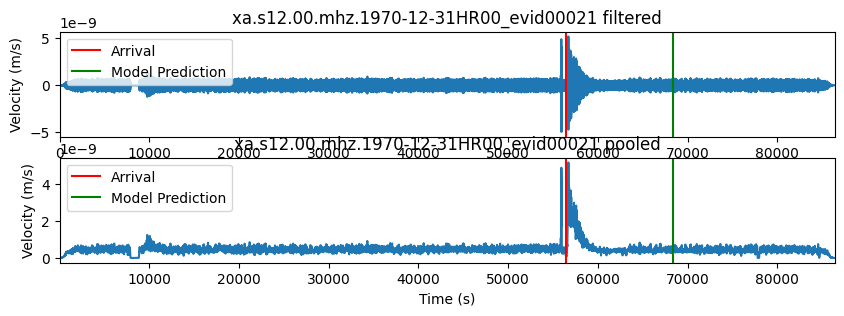

Predicted Time: 72045.1320754717
Actual Time: 45600.0
Predicted Index: 4772
Loss: 8.76662826538086



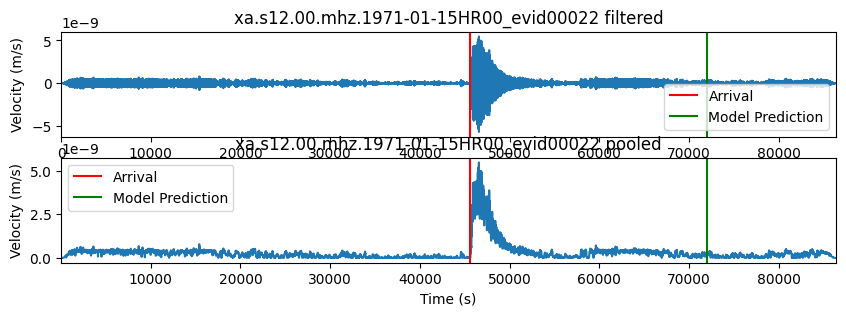

Predicted Time: 72045.1320754717
Actual Time: 53940.0
Predicted Index: 4772
Loss: 8.830607414245605



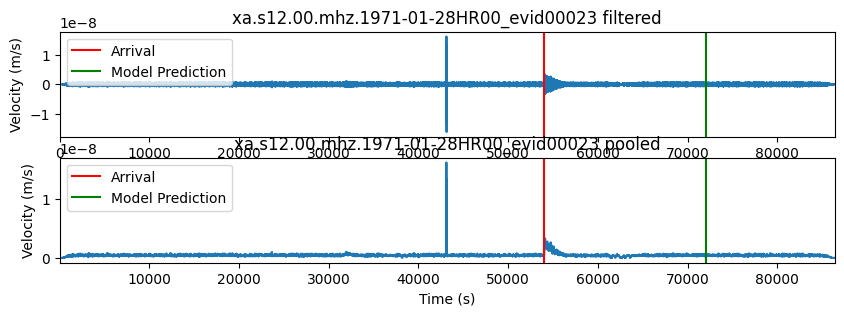

Predicted Time: 42233.81132075472
Actual Time: 66060.0
Predicted Index: 2797
Loss: 8.796249389648438



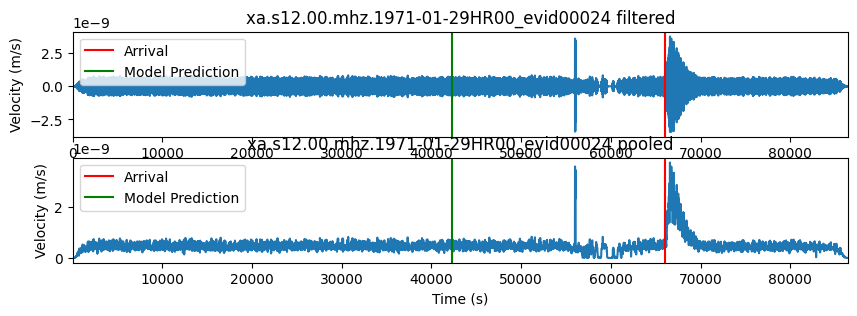

Predicted Time: 71818.71698113208
Actual Time: 13320.0
Predicted Index: 4757
Loss: 8.750961303710938



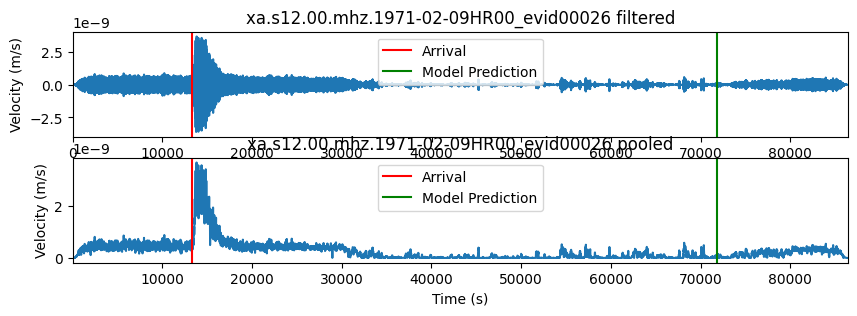

Predicted Time: 41448.90566037736
Actual Time: 55080.0
Predicted Index: 2745
Loss: 8.79227066040039



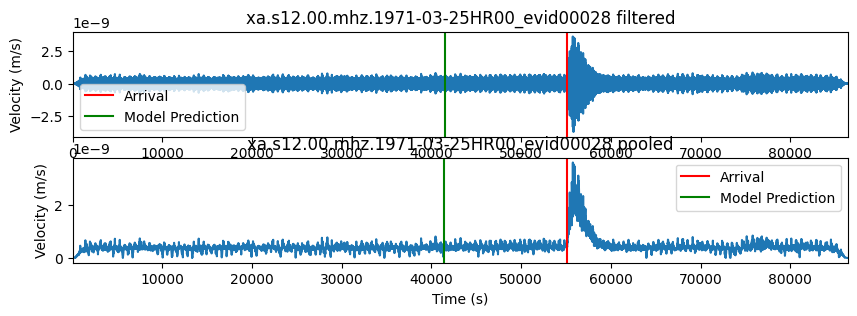

File not found: ../nasa_space_apps/demo/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1971-04-13HR00_evid00029.csv
Predicted Time: 46188.52830188679
Actual Time: 25440.0
Predicted Index: 3059
Loss: 8.787540435791016



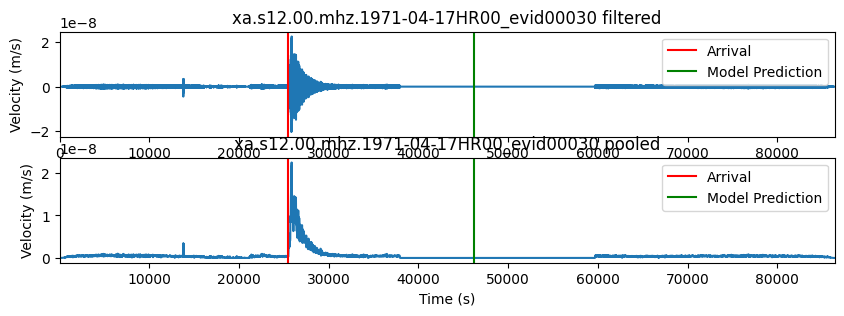

Predicted Time: 46188.52830188679
Actual Time: 29100.0
Predicted Index: 3059
Loss: 8.801490783691406



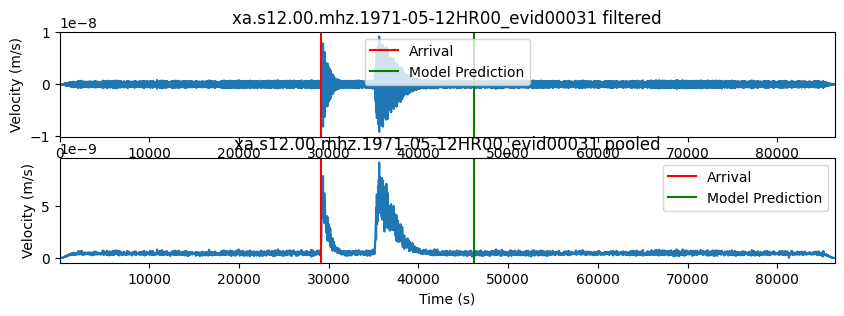

Predicted Time: 26505.509433962263
Actual Time: 35100.0
Predicted Index: 1755
Loss: 8.789173126220703



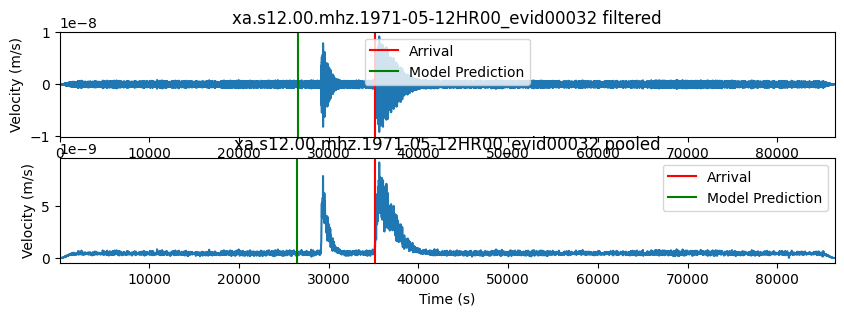

Predicted Time: 74037.58490566038
Actual Time: 10800.0
Predicted Index: 4904
Loss: 8.793846130371094



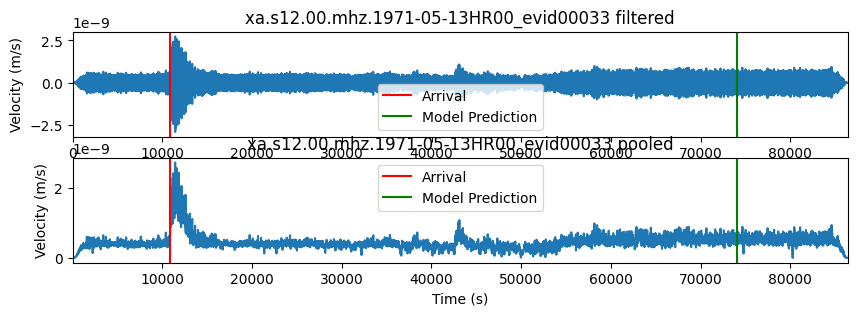

Predicted Time: 74037.58490566038
Actual Time: 80400.0
Predicted Index: 4904
Loss: 8.74718189239502



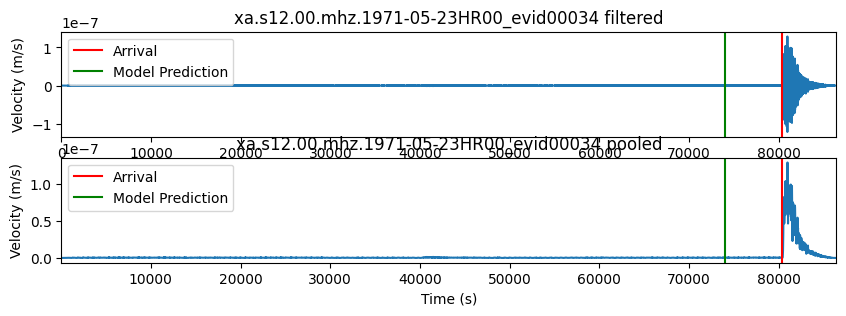

Predicted Time: 56452.67924528302
Actual Time: 39060.0
Predicted Index: 3739
Loss: 8.755254745483398



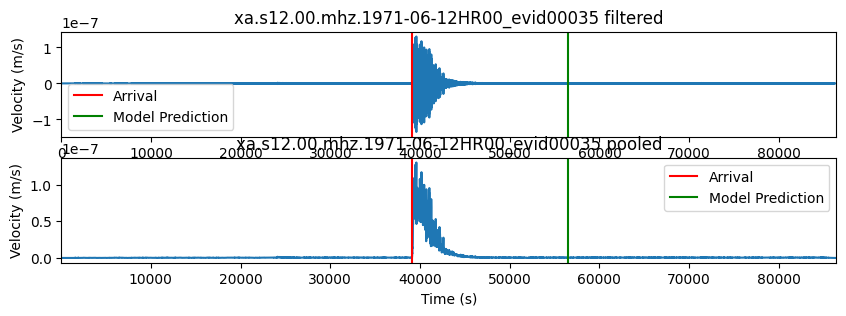

Predicted Time: 56452.67924528302
Actual Time: 19800.0
Predicted Index: 3739
Loss: 8.748096466064453



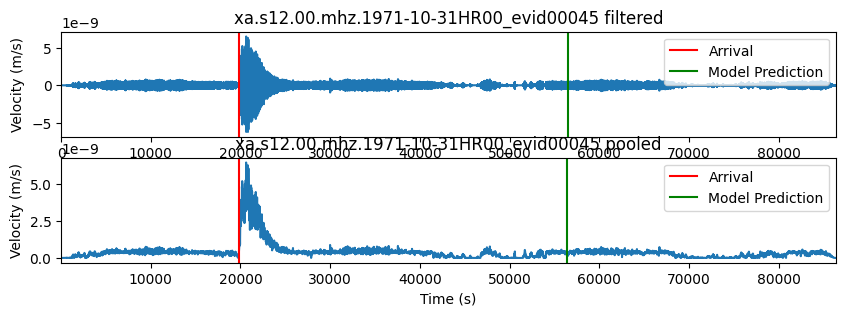

Predicted Time: 45599.84905660377
Actual Time: 23700.0
Predicted Index: 3020
Loss: 8.723304748535156



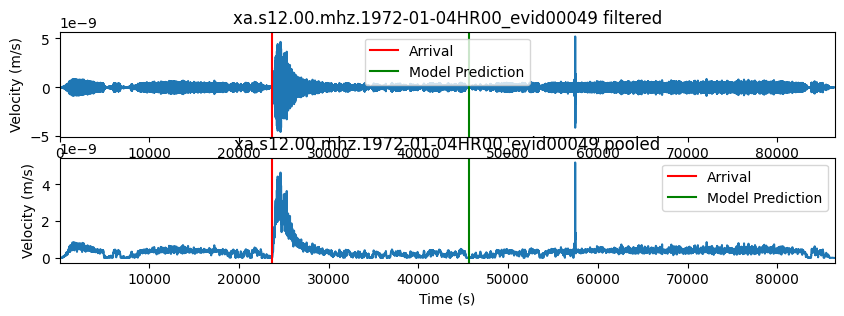

Predicted Time: 45599.84905660377
Actual Time: 8580.0
Predicted Index: 3020
Loss: 8.696861267089844



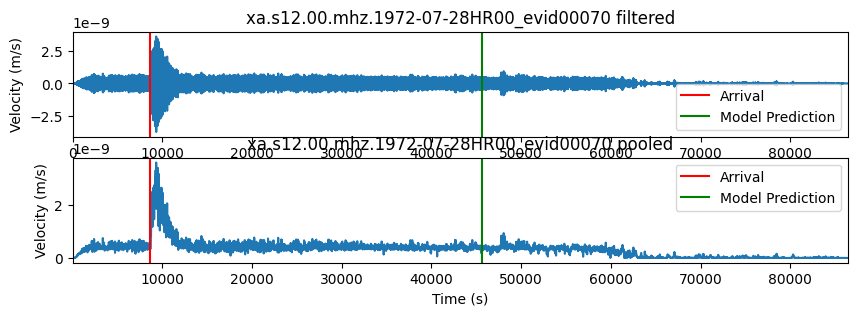

Predicted Time: 45599.84905660377
Actual Time: 65280.0
Predicted Index: 3020
Loss: 8.704814910888672



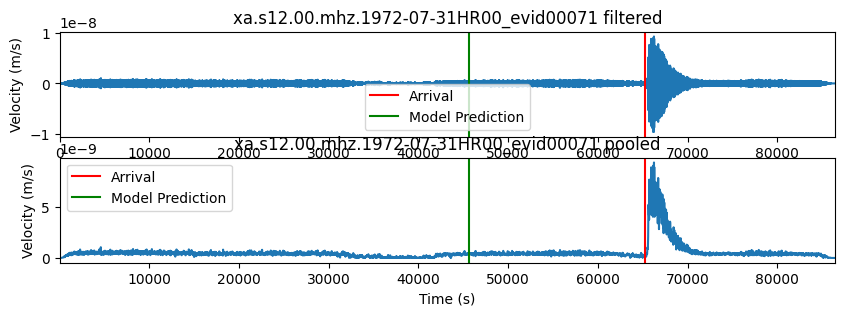

Predicted Time: 45599.84905660377
Actual Time: 82860.0
Predicted Index: 3020
Loss: 8.690177917480469



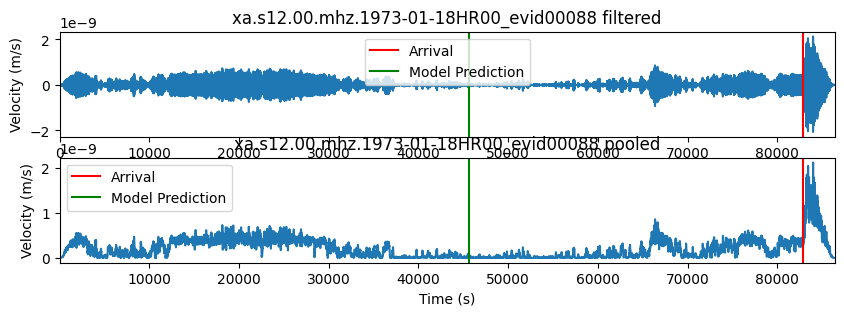

Predicted Time: 53931.92452830189
Actual Time: 2640.0
Predicted Index: 3572
Loss: 8.675352096557617



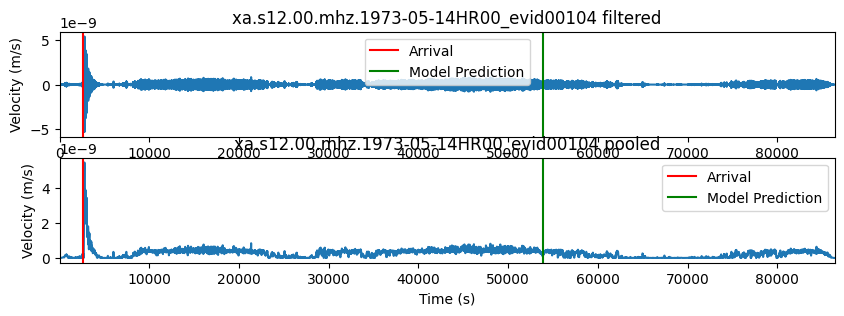

Predicted Time: 53931.92452830189
Actual Time: 6120.0
Predicted Index: 3572
Loss: 8.684503555297852



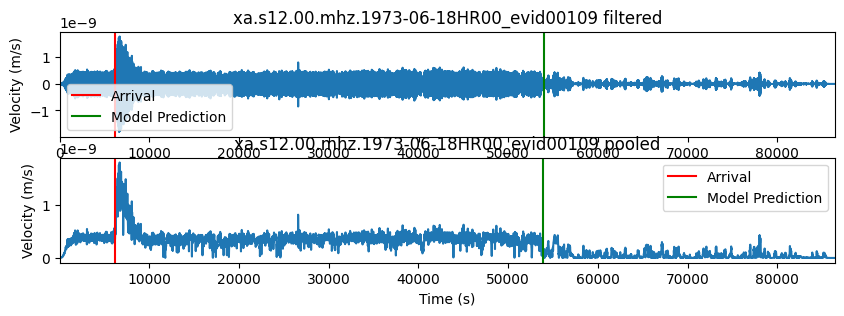

Predicted Time: 53931.92452830189
Actual Time: 68520.0
Predicted Index: 3572
Loss: 8.672112464904785



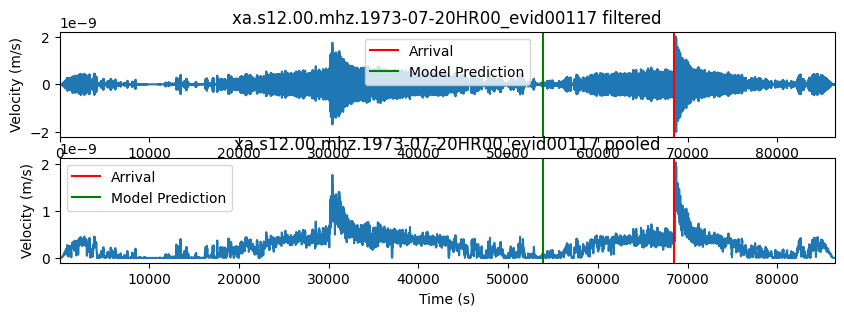

Predicted Time: 53931.92452830189
Actual Time: 44220.0
Predicted Index: 3572
Loss: 8.680699348449707



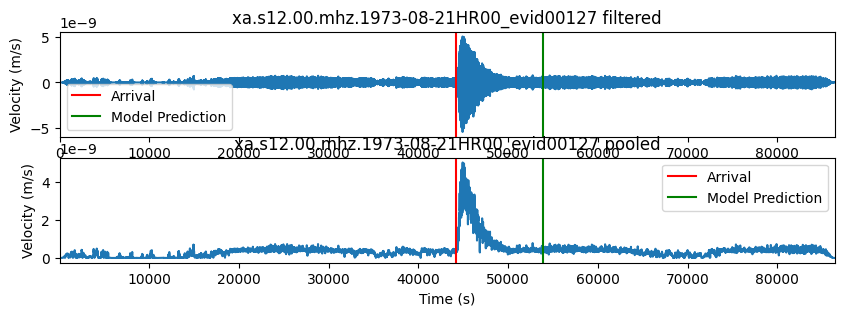

Predicted Time: 13313.056603773584
Actual Time: 84060.0
Predicted Index: 881
Loss: 8.664948463439941



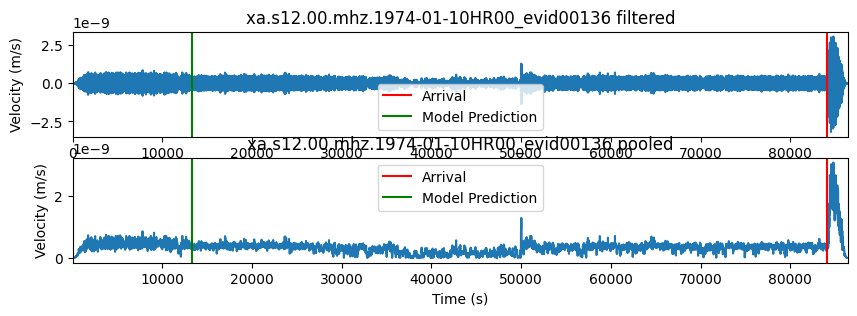

Predicted Time: 13313.056603773584
Actual Time: 22860.0
Predicted Index: 881
Loss: 8.649225234985352



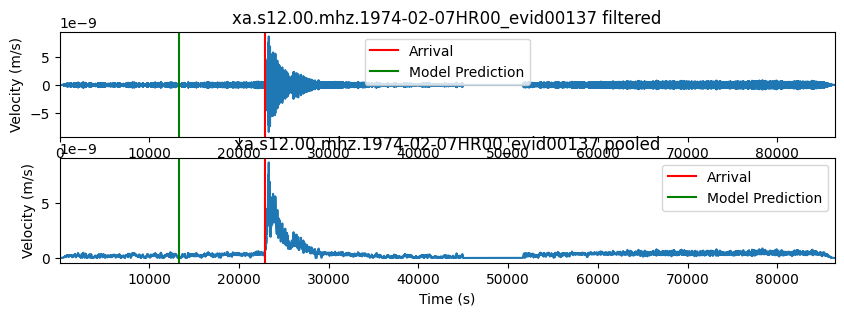

Predicted Time: 25433.81132075472
Actual Time: 81000.0
Predicted Index: 1684
Loss: 8.658817291259766



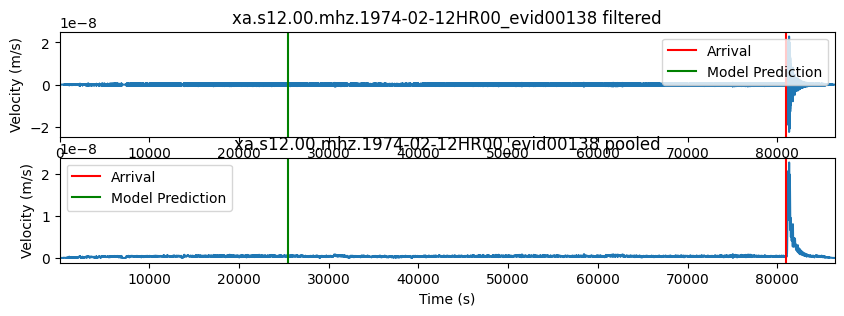

Predicted Time: 25433.81132075472
Actual Time: 31200.0
Predicted Index: 1684
Loss: 8.6651029586792



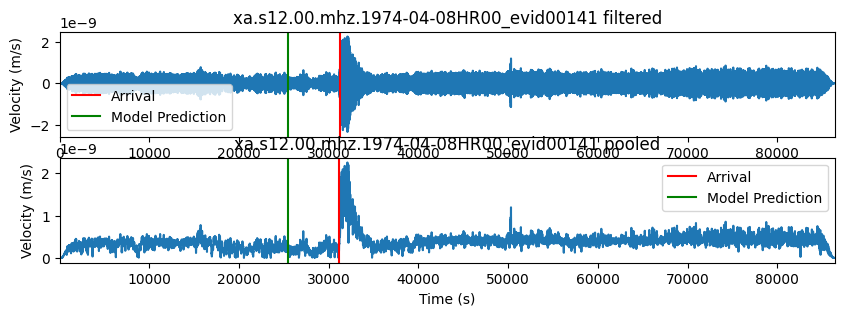

Predicted Time: 25433.81132075472
Actual Time: 1380.0
Predicted Index: 1684
Loss: 8.670159339904785



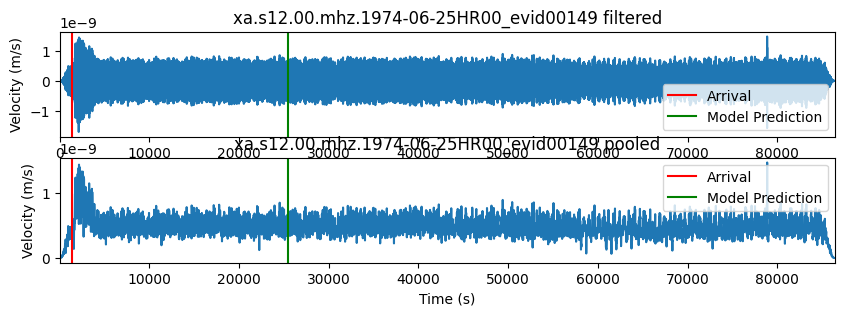

Predicted Time: 25433.81132075472
Actual Time: 10620.0
Predicted Index: 1684
Loss: 8.660113334655762



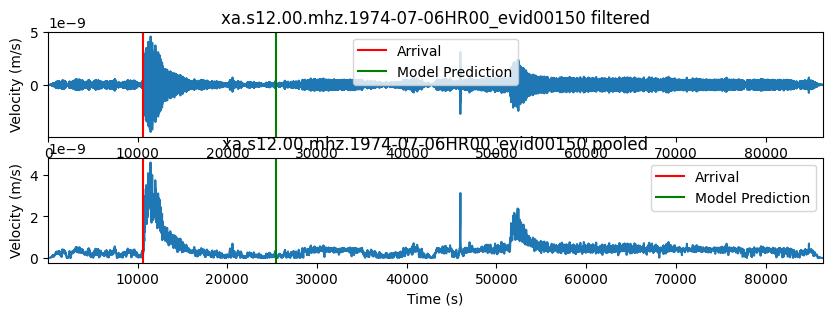

Predicted Time: 39048.90566037736
Actual Time: 51240.0
Predicted Index: 2586
Loss: 8.661026000976562



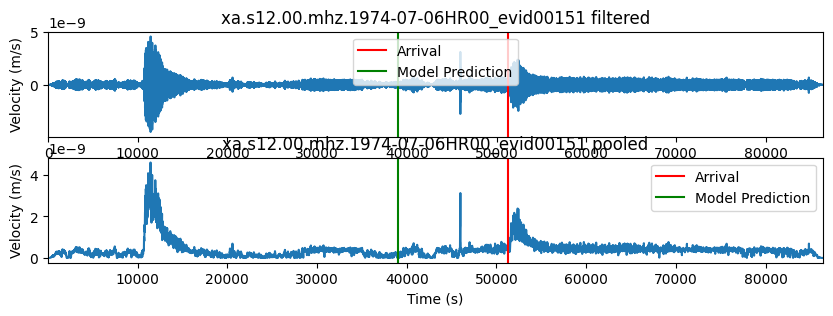

Predicted Time: 39048.90566037736
Actual Time: 3120.0
Predicted Index: 2586
Loss: 8.648612976074219



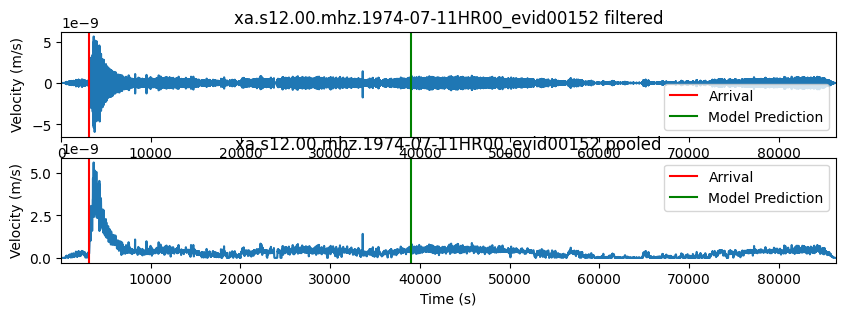

Predicted Time: 39048.90566037736
Actual Time: 43500.0
Predicted Index: 2586
Loss: 8.671533584594727



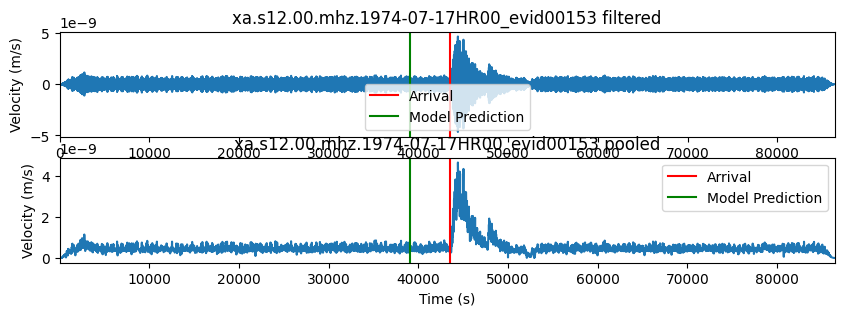

Predicted Time: 2626.264150943396
Actual Time: 63780.0
Predicted Index: 173
Loss: 8.64389419555664



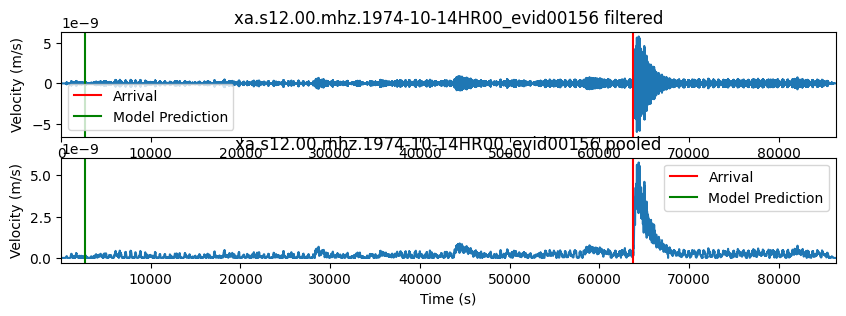

Predicted Time: 2626.264150943396
Actual Time: 65700.0
Predicted Index: 173
Loss: 8.659531593322754



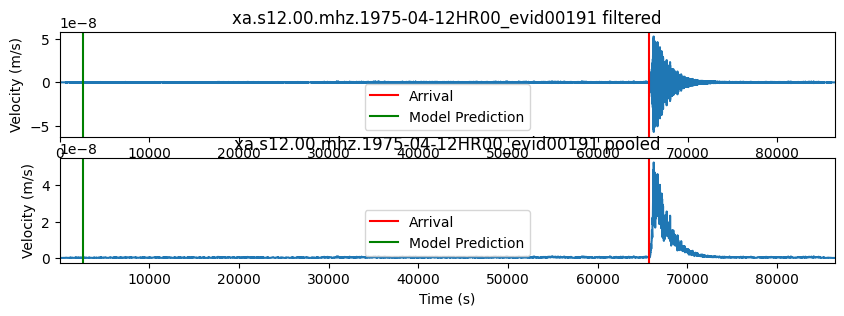

Predicted Time: 2626.264150943396
Actual Time: 36300.0
Predicted Index: 173
Loss: 8.654524803161621



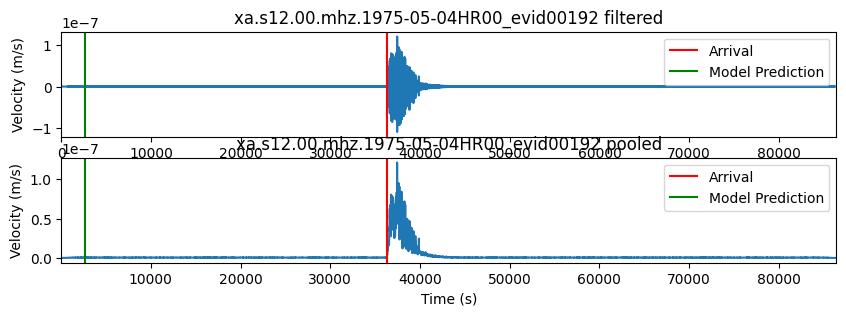

Predicted Time: 2626.264150943396
Actual Time: 57780.0
Predicted Index: 173
Loss: 8.658669471740723



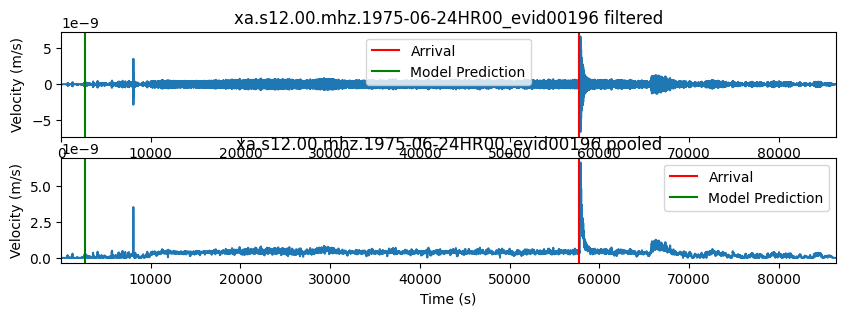

Predicted Time: 22852.67924528302
Actual Time: 12240.0
Predicted Index: 1513
Loss: 8.648752212524414



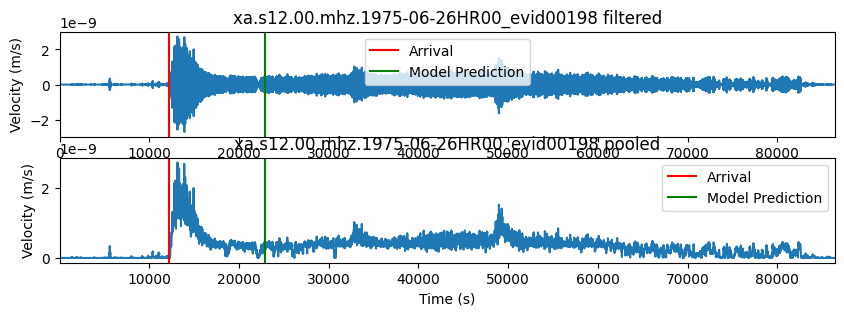

Predicted Time: 22852.67924528302
Actual Time: 73500.0
Predicted Index: 1513
Loss: 8.51225757598877



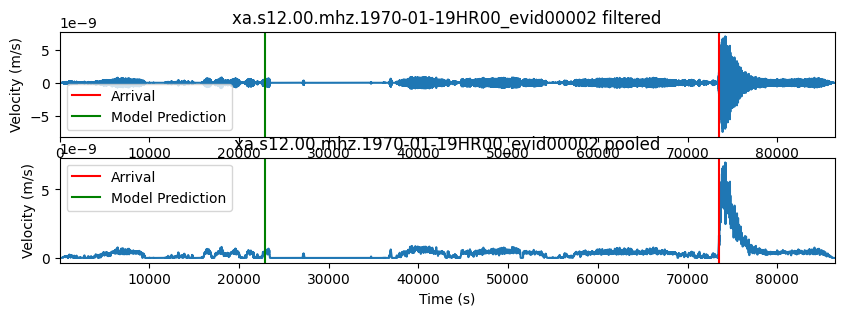

Predicted Time: 22852.67924528302
Actual Time: 12720.0
Predicted Index: 1513
Loss: 8.65259838104248



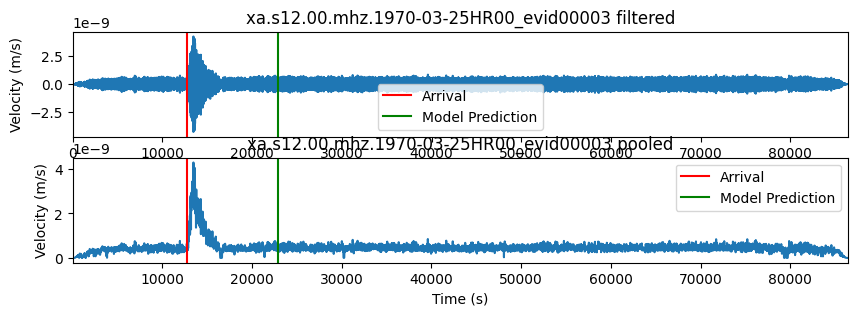

Predicted Time: 10611.169811320757
Actual Time: 73020.0
Predicted Index: 702
Loss: 8.697202682495117



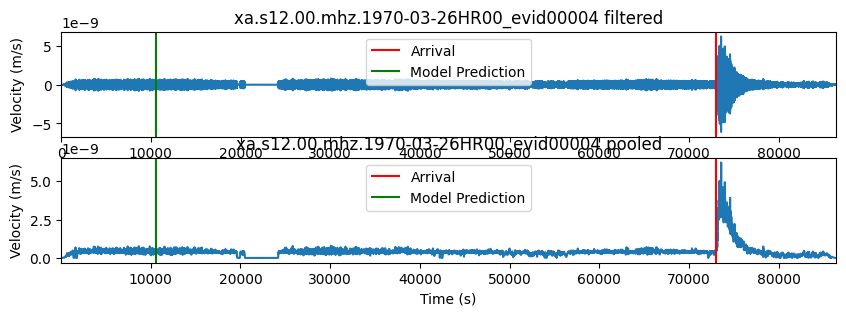

Predicted Time: 10611.169811320757
Actual Time: 4440.0
Predicted Index: 702
Loss: 8.64438247680664



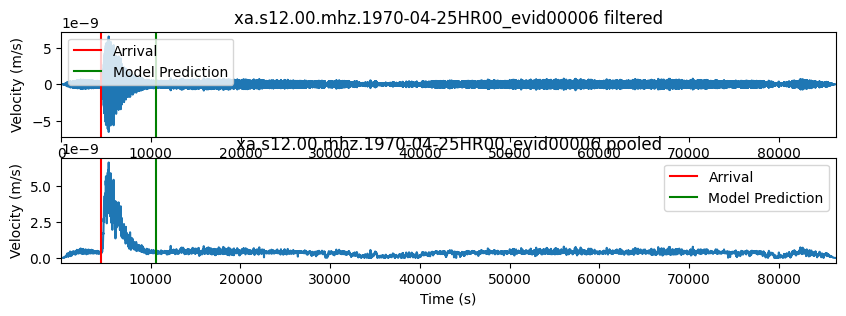

Predicted Time: 3109.2830188679245
Actual Time: 52140.0
Predicted Index: 205
Loss: 8.599873542785645



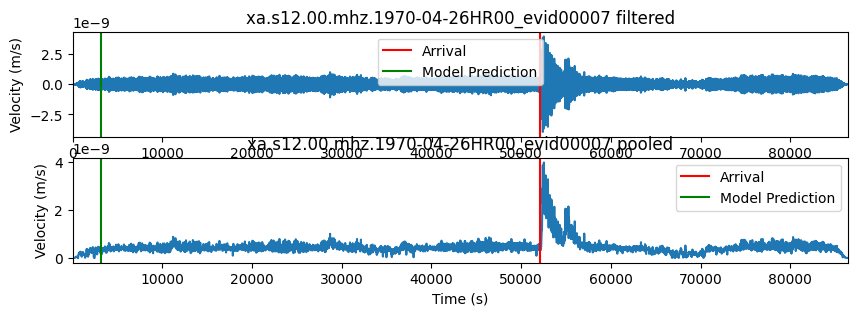

Predicted Time: 73494.18867924529
Actual Time: 68400.0
Predicted Index: 4868
Loss: 8.535341262817383



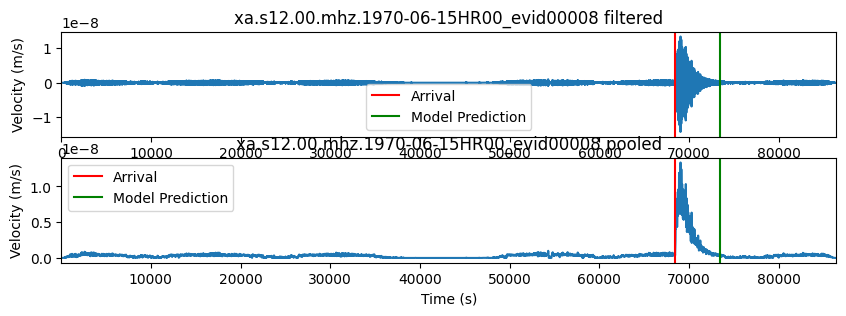

Predicted Time: 73494.18867924529
Actual Time: 72060.0
Predicted Index: 4868
Loss: 8.474655151367188



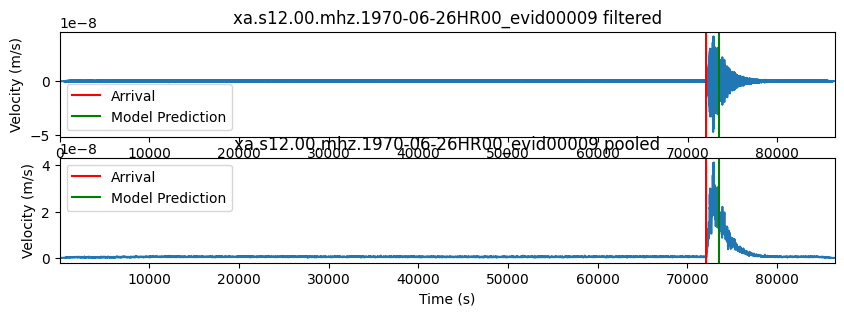

Predicted Time: 73494.18867924529
Actual Time: 18360.0
Predicted Index: 4868
Loss: 8.410771369934082



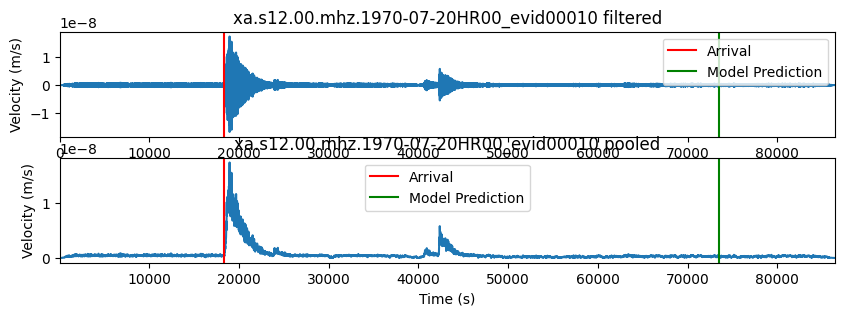

Predicted Time: 73494.18867924529
Actual Time: 42240.0
Predicted Index: 4868
Loss: 8.389886856079102



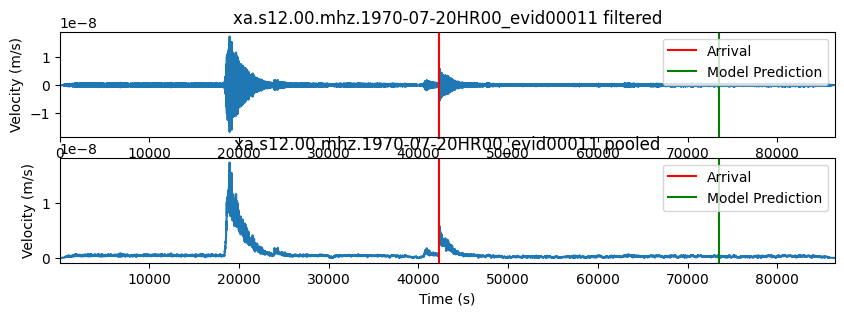

Predicted Time: 73494.18867924529
Actual Time: 71820.0
Predicted Index: 4868
Loss: 8.383087158203125



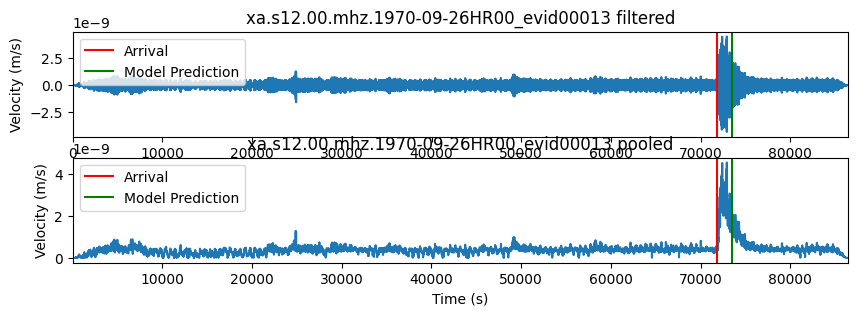

Predicted Time: 73494.18867924529
Actual Time: 41460.0
Predicted Index: 4868
Loss: 8.370990753173828



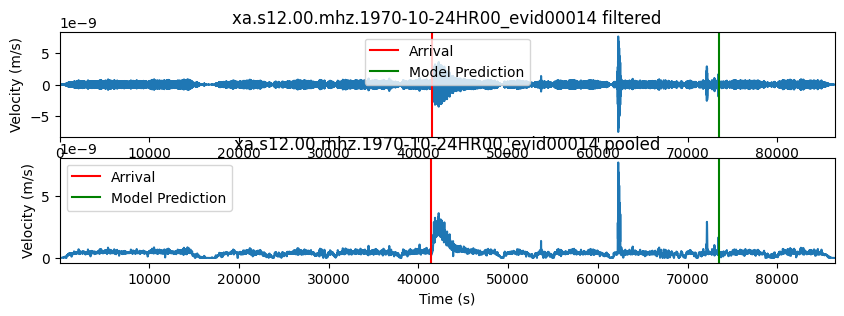

Predicted Time: 73494.18867924529
Actual Time: 46200.0
Predicted Index: 4868
Loss: 8.377031326293945



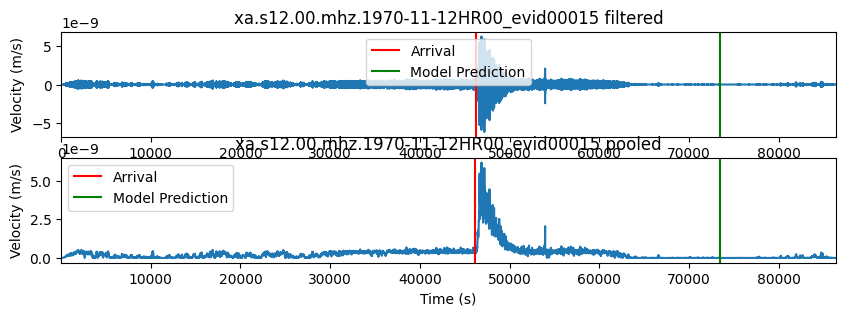

Predicted Time: 73494.18867924529
Actual Time: 26520.0
Predicted Index: 4868
Loss: 8.314583778381348



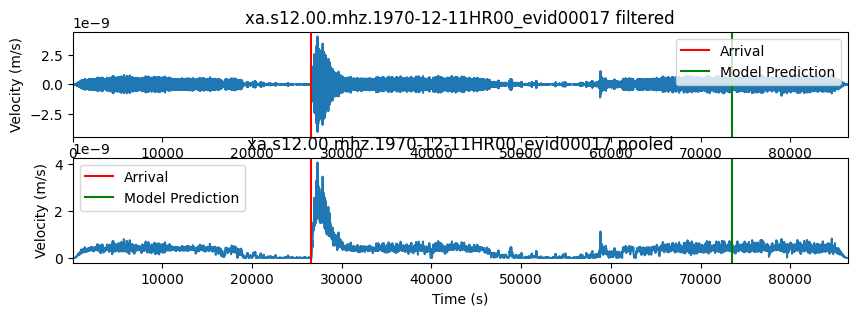

Predicted Time: 73494.18867924529
Actual Time: 74040.0
Predicted Index: 4868
Loss: 8.340651512145996



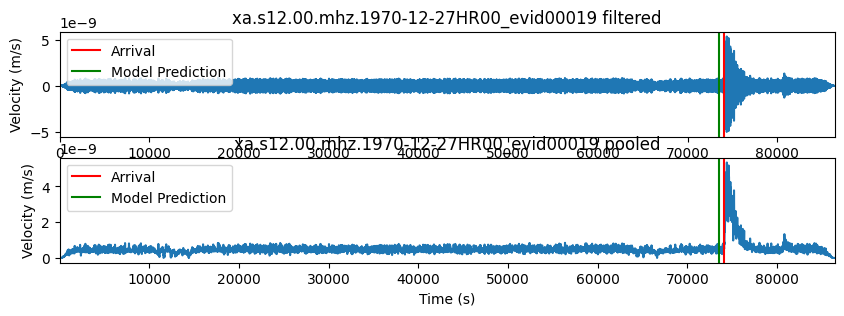

Predicted Time: 73494.18867924529
Actual Time: 56460.0
Predicted Index: 4868
Loss: 8.336653709411621



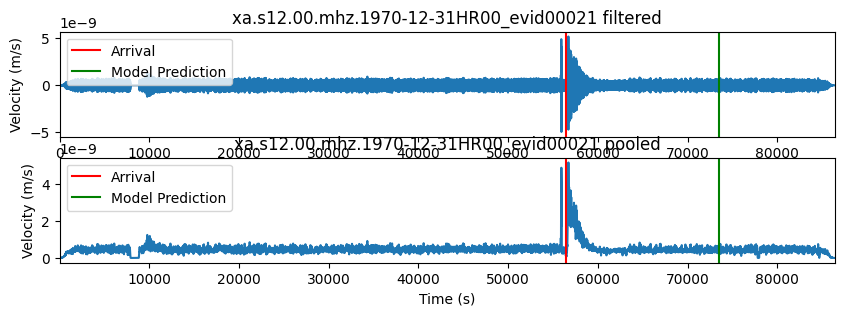

Predicted Time: 73494.18867924529
Actual Time: 45600.0
Predicted Index: 4868
Loss: 8.282143592834473



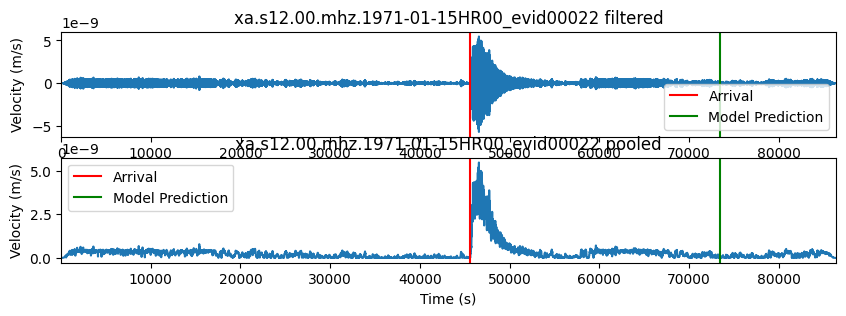

Predicted Time: 73494.18867924529
Actual Time: 53940.0
Predicted Index: 4868
Loss: 8.294273376464844



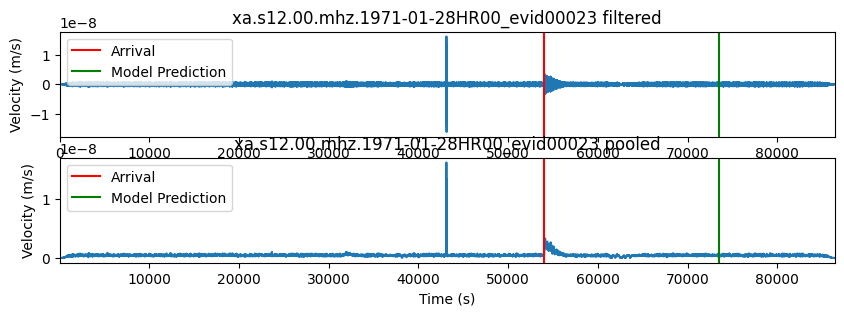

Predicted Time: 73494.18867924529
Actual Time: 66060.0
Predicted Index: 4868
Loss: 8.224897384643555



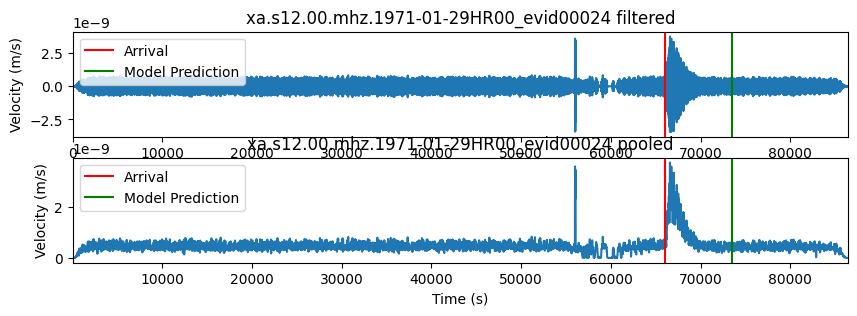

Predicted Time: 68392.30188679245
Actual Time: 13320.0
Predicted Index: 4530
Loss: 8.251791954040527



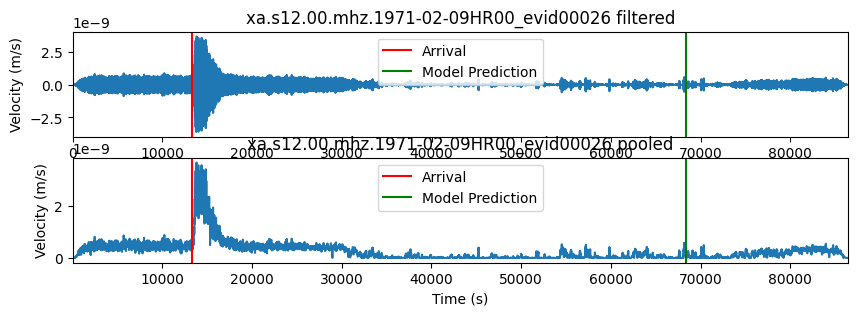

Predicted Time: 72045.1320754717
Actual Time: 55080.0
Predicted Index: 4772
Loss: 8.222794532775879



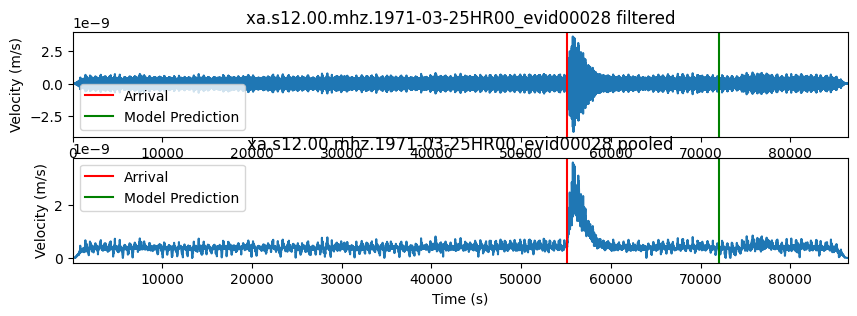

File not found: ../nasa_space_apps/demo/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1971-04-13HR00_evid00029.csv
Predicted Time: 42233.81132075472
Actual Time: 25440.0
Predicted Index: 2797
Loss: 8.198221206665039



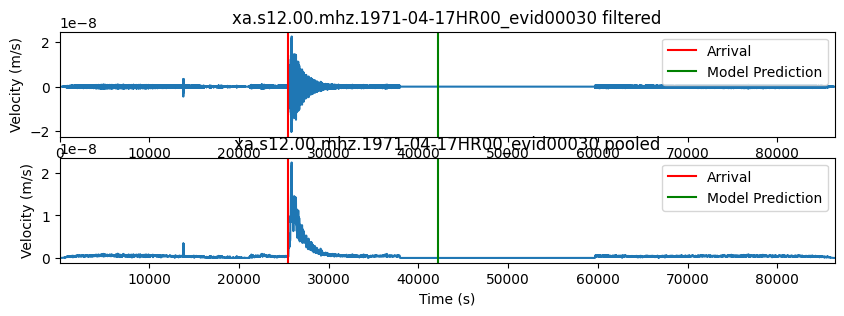

Predicted Time: 26505.509433962263
Actual Time: 29100.0
Predicted Index: 1755
Loss: 8.130719184875488



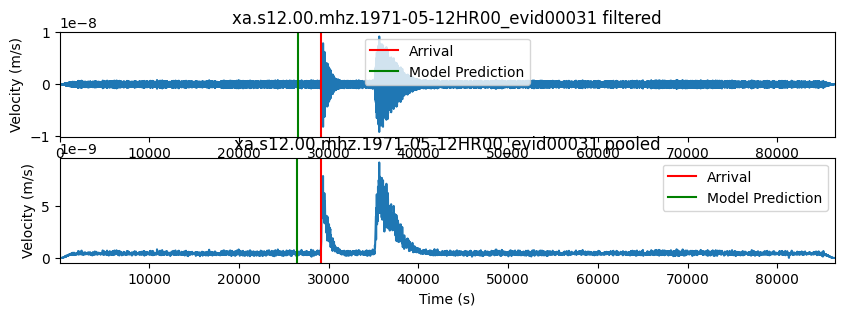

Predicted Time: 26505.509433962263
Actual Time: 35100.0
Predicted Index: 1755
Loss: 8.176360130310059



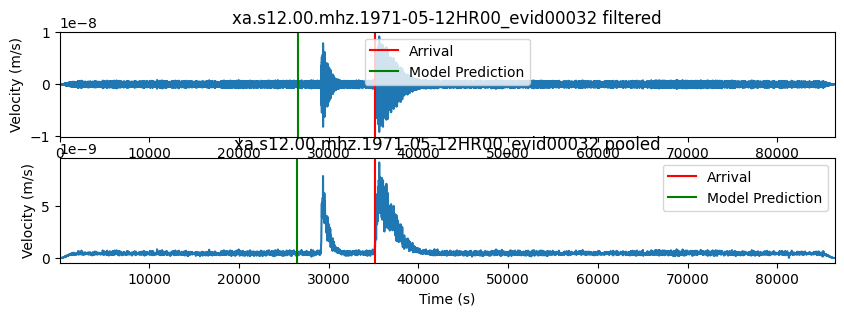

Predicted Time: 74037.58490566038
Actual Time: 10800.0
Predicted Index: 4904
Loss: 8.138240814208984



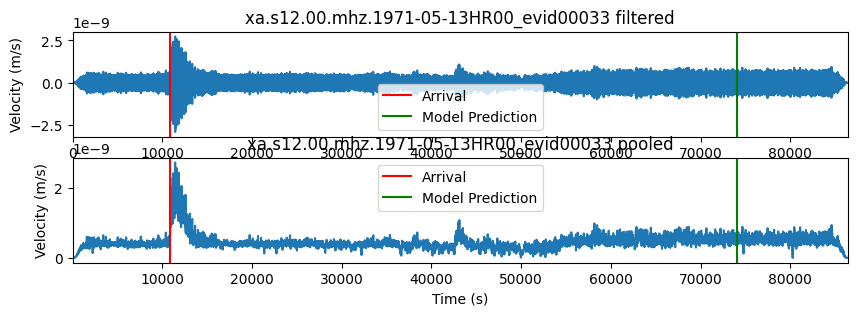

Predicted Time: 56452.67924528302
Actual Time: 80400.0
Predicted Index: 3739
Loss: 8.05510139465332



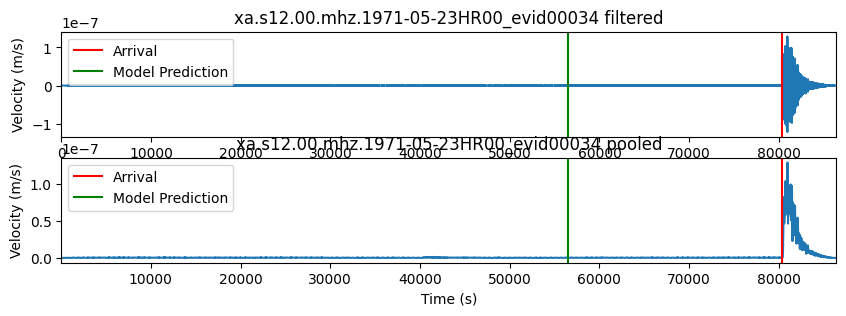

Predicted Time: 45599.84905660377
Actual Time: 39060.0
Predicted Index: 3020
Loss: 7.853892803192139



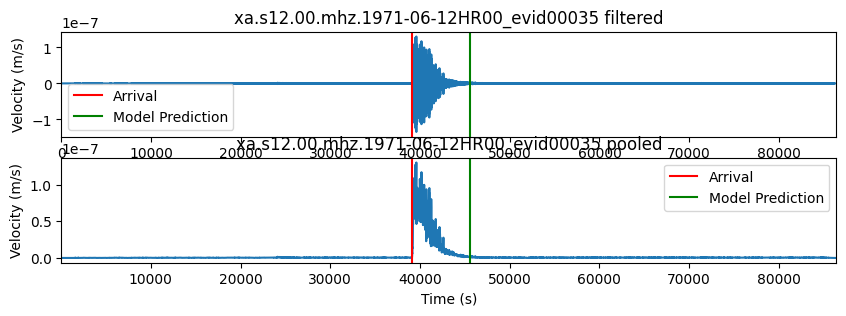

Predicted Time: 53931.92452830189
Actual Time: 19800.0
Predicted Index: 3572
Loss: 7.582192420959473



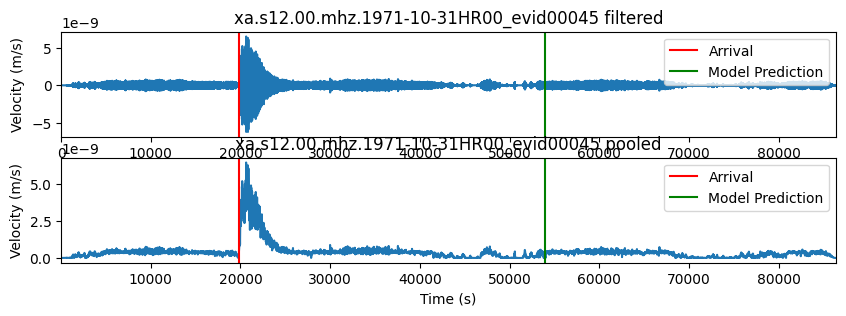

Predicted Time: 66052.67924528301
Actual Time: 23700.0
Predicted Index: 4375
Loss: 7.207383632659912



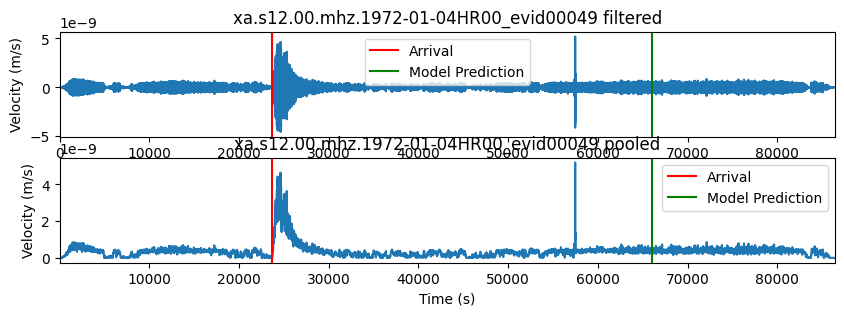

Predicted Time: 66052.67924528301
Actual Time: 8580.0
Predicted Index: 4375
Loss: 6.593808174133301



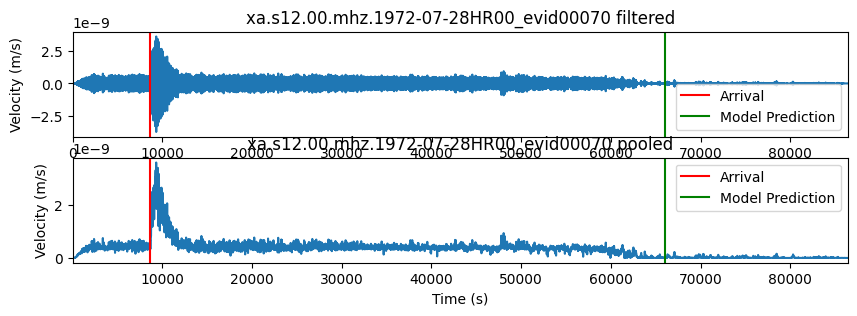

Predicted Time: 13313.056603773584
Actual Time: 65280.0
Predicted Index: 881
Loss: 5.995944976806641



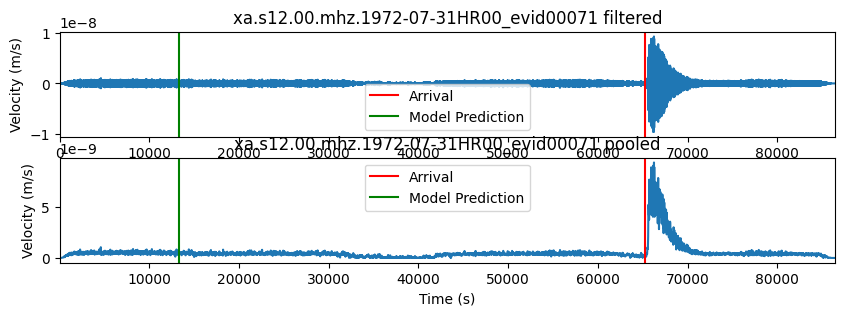

Predicted Time: 13313.056603773584
Actual Time: 82860.0
Predicted Index: 881
Loss: 5.627810478210449



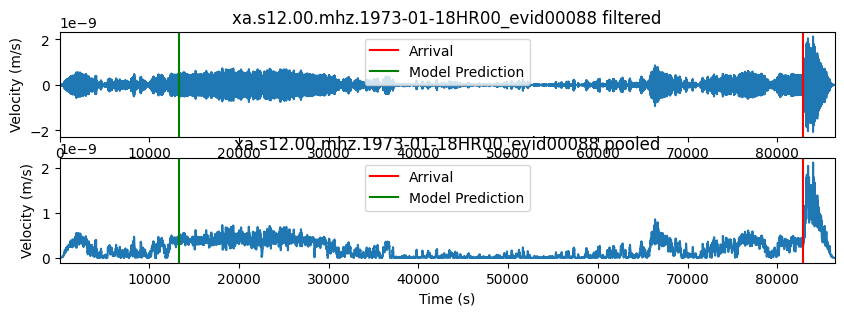

Predicted Time: 13313.056603773584
Actual Time: 2640.0
Predicted Index: 881
Loss: 5.068630218505859



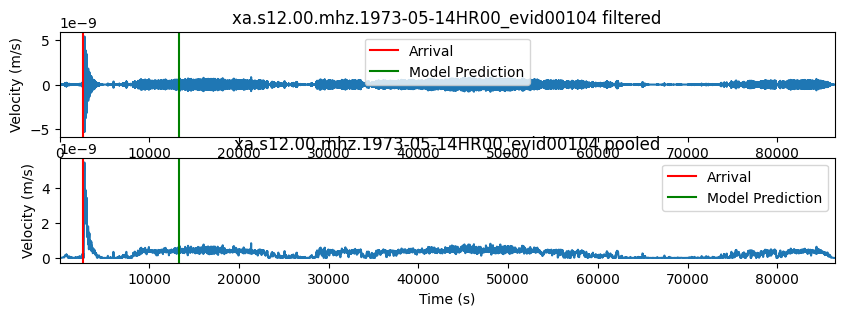

Predicted Time: 29086.64150943396
Actual Time: 6120.0
Predicted Index: 1926
Loss: 4.891942977905273



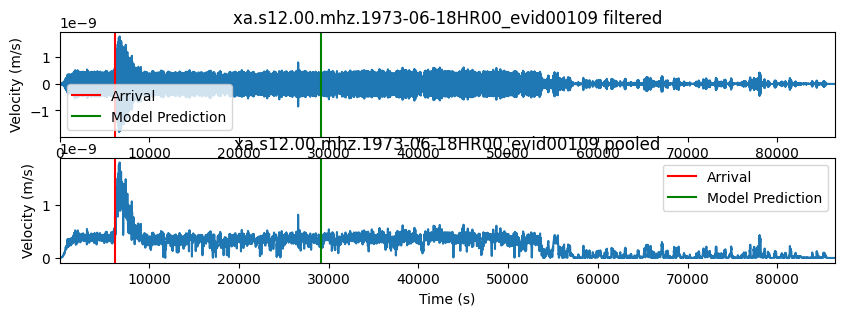

Predicted Time: 29086.64150943396
Actual Time: 68520.0
Predicted Index: 1926
Loss: 4.920026779174805



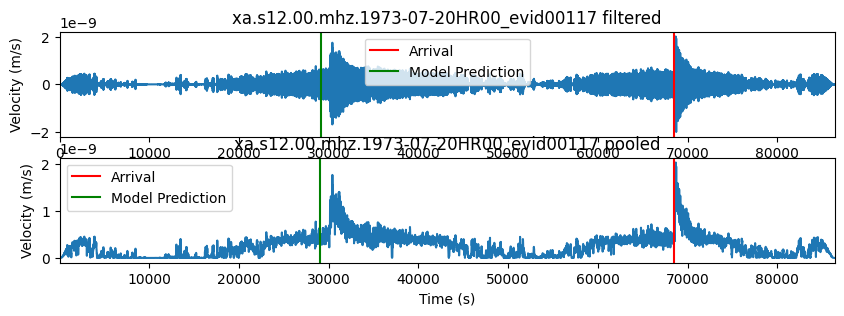

Predicted Time: 65267.77358490566
Actual Time: 44220.0
Predicted Index: 4323
Loss: 5.188051223754883



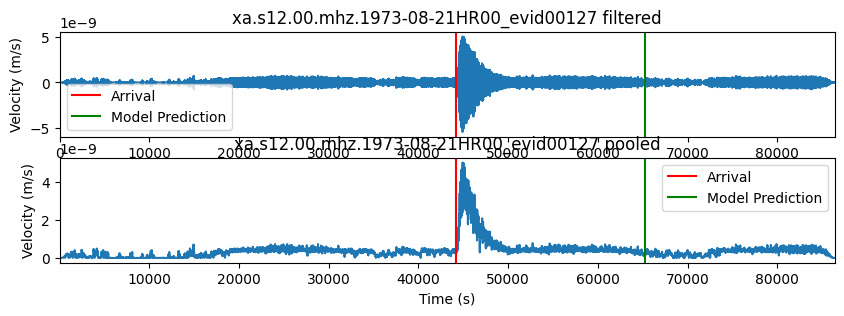

Predicted Time: 65267.77358490566
Actual Time: 84060.0
Predicted Index: 4323
Loss: 5.487497329711914



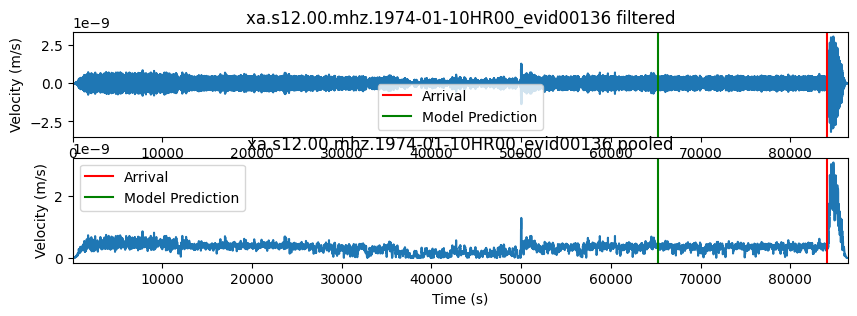

Predicted Time: 65267.77358490566
Actual Time: 22860.0
Predicted Index: 4323
Loss: 6.125382900238037



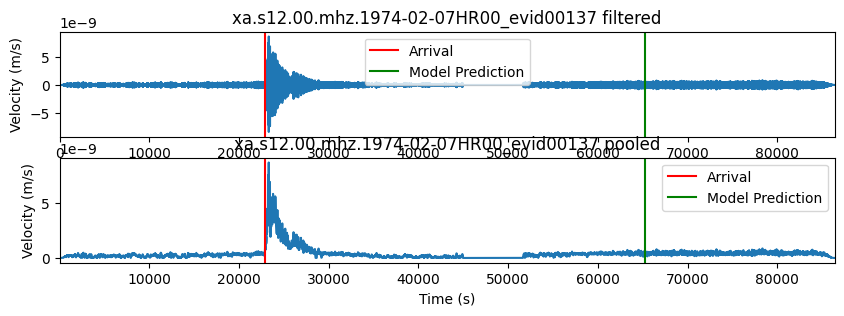

Predicted Time: 2626.264150943396
Actual Time: 81000.0
Predicted Index: 173
Loss: 6.1678385734558105



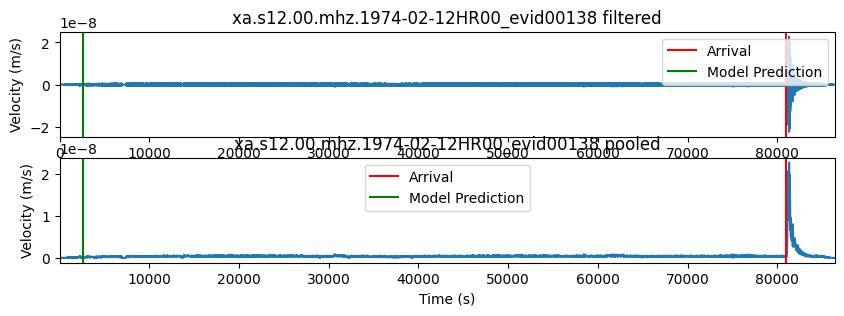

Predicted Time: 2626.264150943396
Actual Time: 31200.0
Predicted Index: 173
Loss: 6.249960899353027



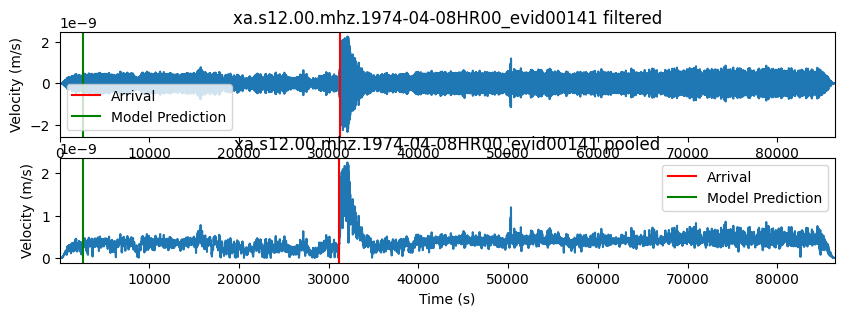

Predicted Time: 2626.264150943396
Actual Time: 1380.0
Predicted Index: 173
Loss: 6.24985408782959



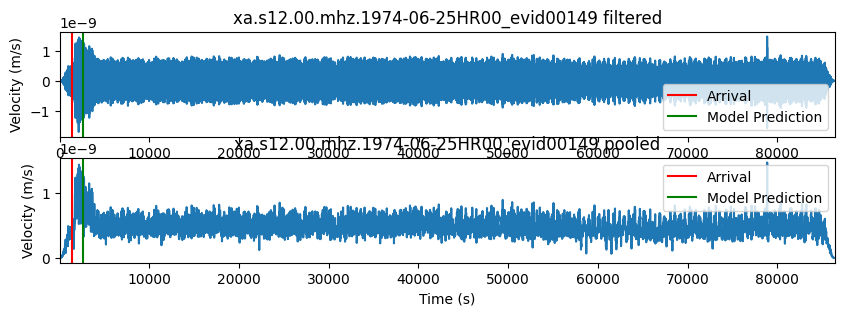

Predicted Time: 6113.056603773585
Actual Time: 10620.0
Predicted Index: 404
Loss: 6.449697494506836



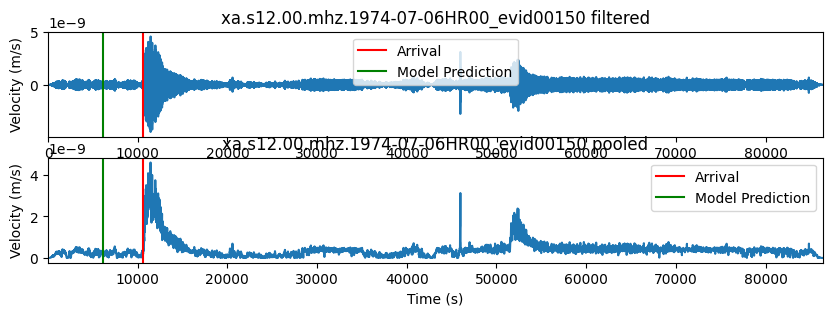

Predicted Time: 68513.05660377358
Actual Time: 51240.0
Predicted Index: 4538
Loss: 6.657815933227539



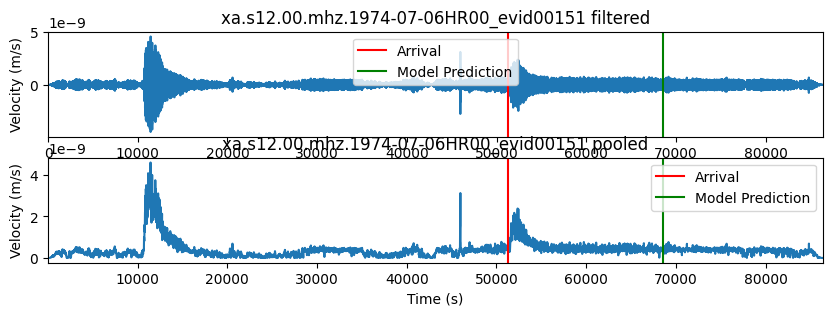

Predicted Time: 44211.16981132075
Actual Time: 3120.0
Predicted Index: 2928
Loss: 6.959076881408691



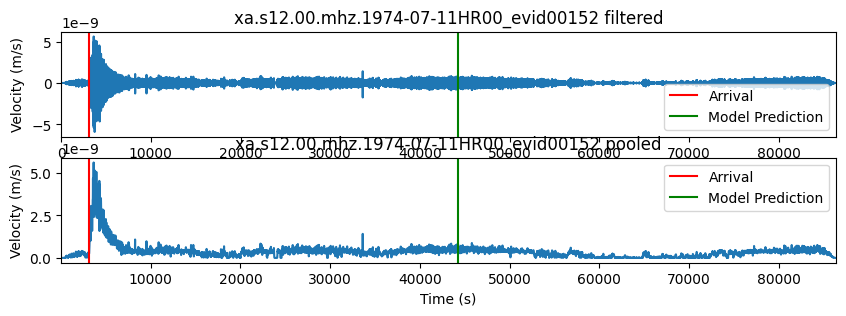

Predicted Time: 84045.1320754717
Actual Time: 43500.0
Predicted Index: 5567
Loss: 7.099414348602295



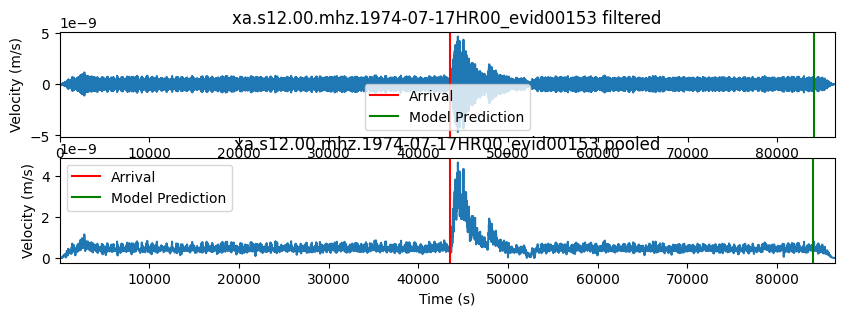

Predicted Time: 80996.07547169812
Actual Time: 63780.0
Predicted Index: 5365
Loss: 6.926814556121826



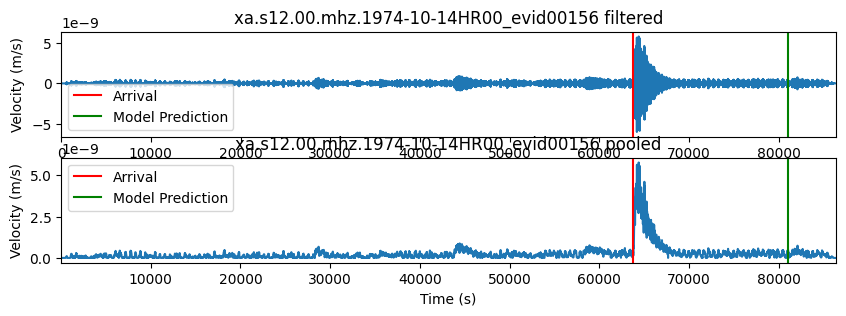

Predicted Time: 31199.849056603773
Actual Time: 65700.0
Predicted Index: 2066
Loss: 6.834575176239014



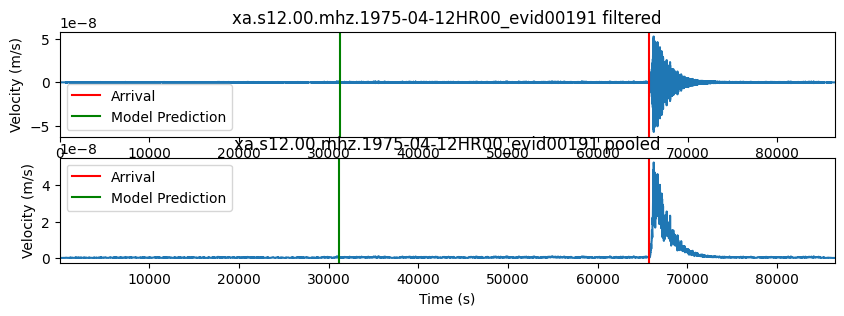

Predicted Time: 1373.433962264151
Actual Time: 36300.0
Predicted Index: 90
Loss: 6.727053642272949



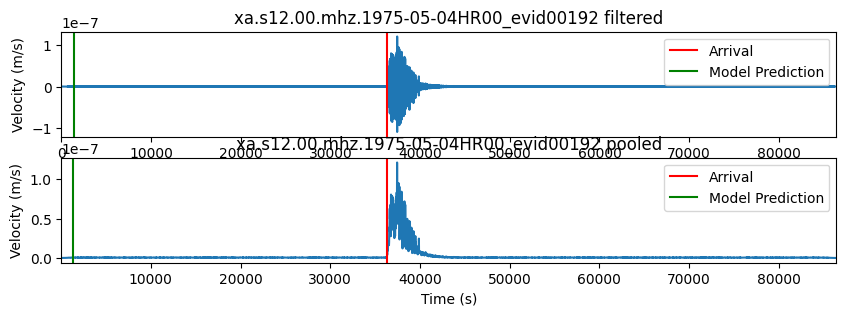

Predicted Time: 10611.169811320757
Actual Time: 57780.0
Predicted Index: 702
Loss: 6.5607500076293945



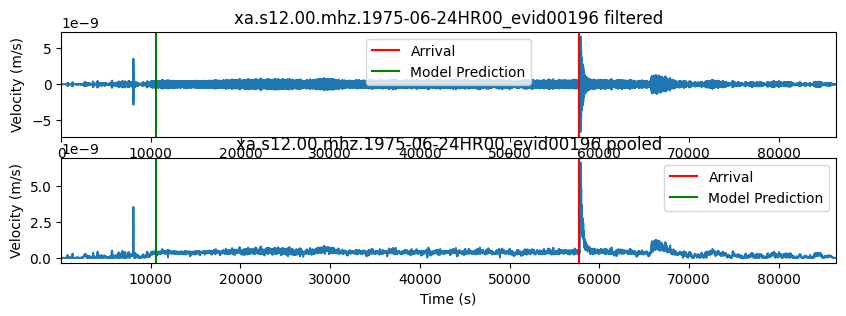

Predicted Time: 51230.03773584906
Actual Time: 12240.0
Predicted Index: 3393
Loss: 6.6155476570129395



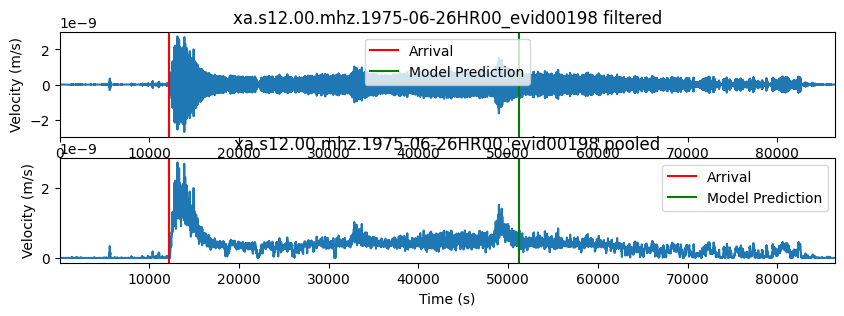

Predicted Time: 3109.2830188679245
Actual Time: 73500.0
Predicted Index: 205
Loss: 5.858821868896484



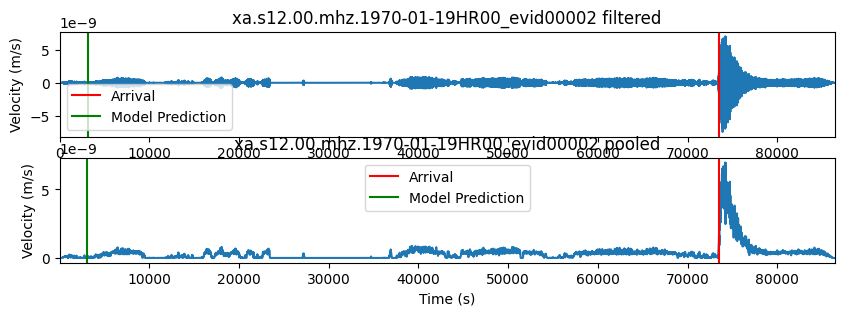

Predicted Time: 43486.64150943396
Actual Time: 12720.0
Predicted Index: 2880
Loss: 6.249523162841797



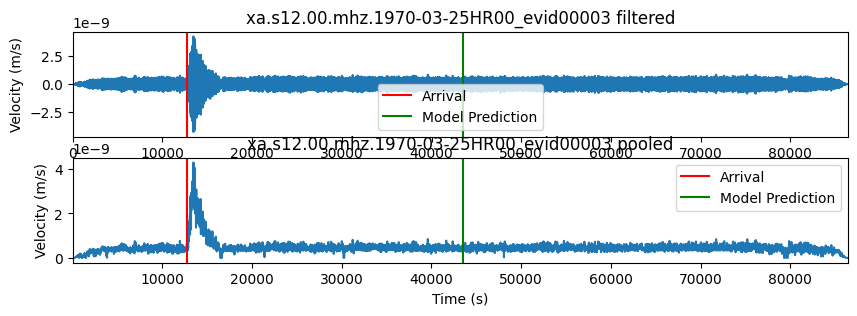

Predicted Time: 63773.43396226415
Actual Time: 73020.0
Predicted Index: 4224
Loss: 6.139341831207275



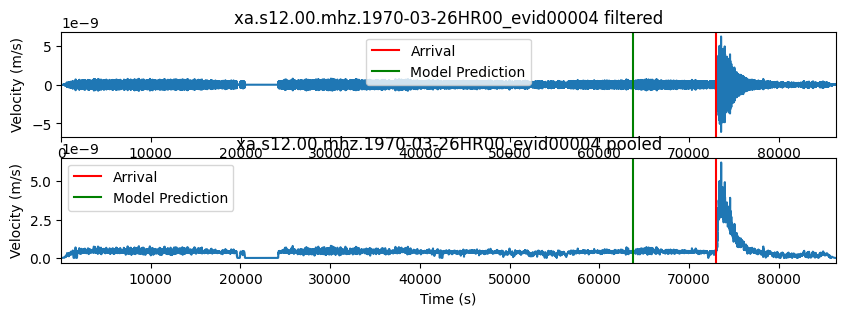

Predicted Time: 65690.41509433962
Actual Time: 4440.0
Predicted Index: 4351
Loss: 6.008072853088379



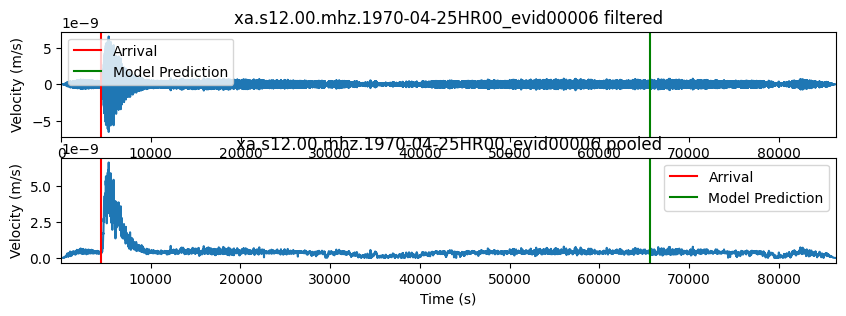

Predicted Time: 36286.64150943396
Actual Time: 52140.0
Predicted Index: 2403
Loss: 5.919952392578125



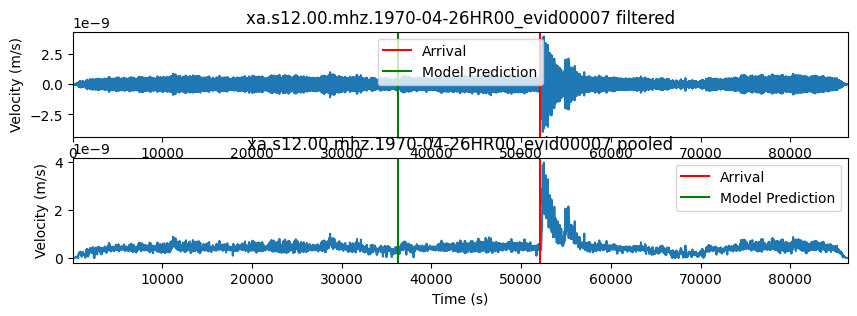

Predicted Time: 57765.88679245283
Actual Time: 68400.0
Predicted Index: 3826
Loss: 5.869131565093994



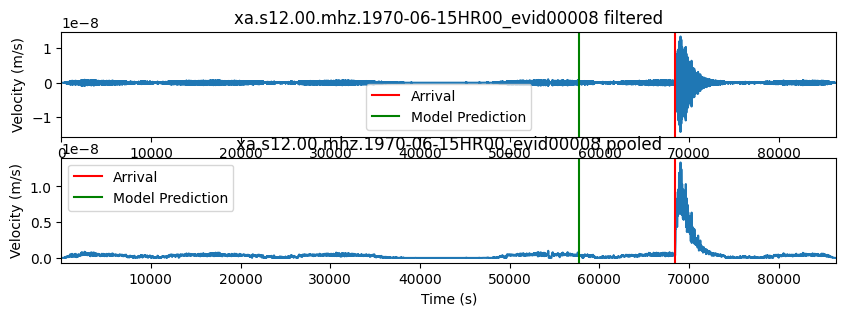

Predicted Time: 73494.18867924529
Actual Time: 72060.0
Predicted Index: 4868
Loss: 5.769894599914551



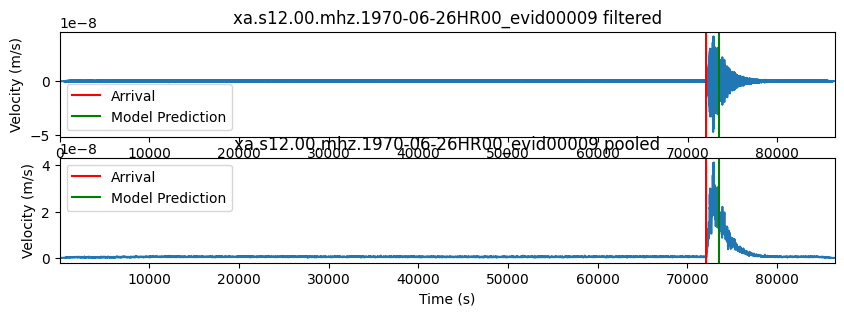

Predicted Time: 73494.18867924529
Actual Time: 18360.0
Predicted Index: 4868
Loss: 5.580657958984375



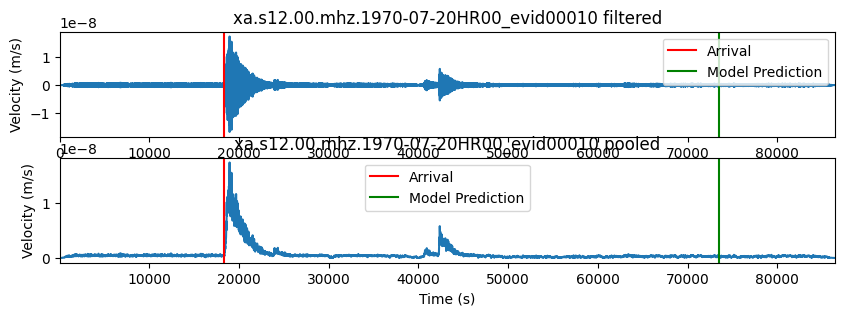

Predicted Time: 73011.16981132075
Actual Time: 42240.0
Predicted Index: 4836
Loss: 5.575665473937988



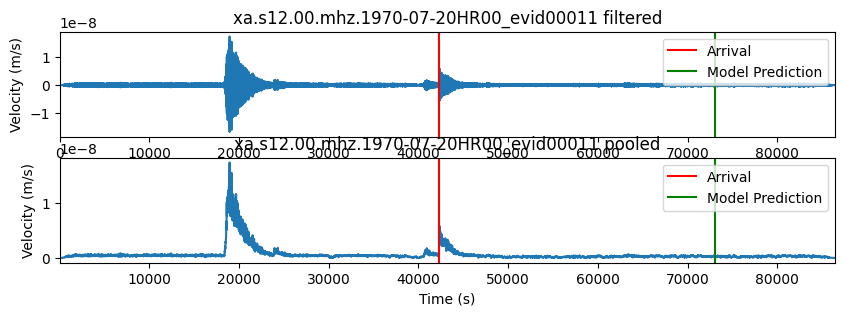

Predicted Time: 73011.16981132075
Actual Time: 71820.0
Predicted Index: 4836
Loss: 5.439138889312744



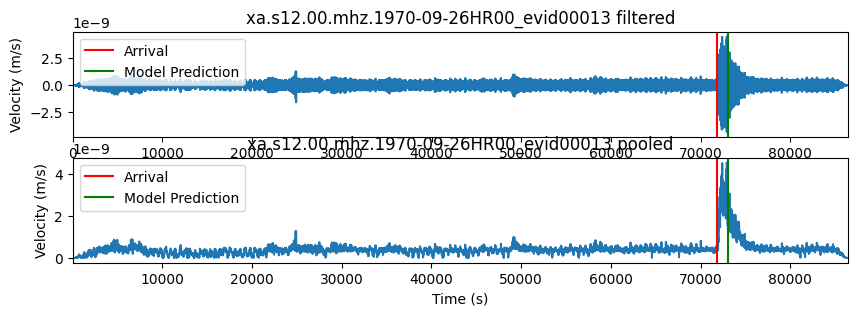

Predicted Time: 4437.584905660377
Actual Time: 41460.0
Predicted Index: 293
Loss: 5.446473598480225



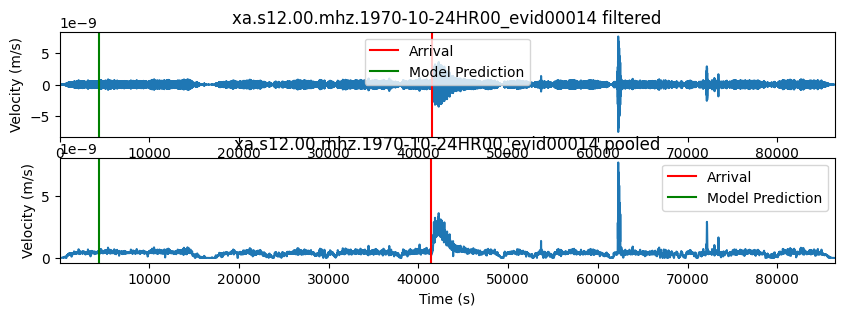

Predicted Time: 52135.698113207545
Actual Time: 46200.0
Predicted Index: 3453
Loss: 5.5150370597839355



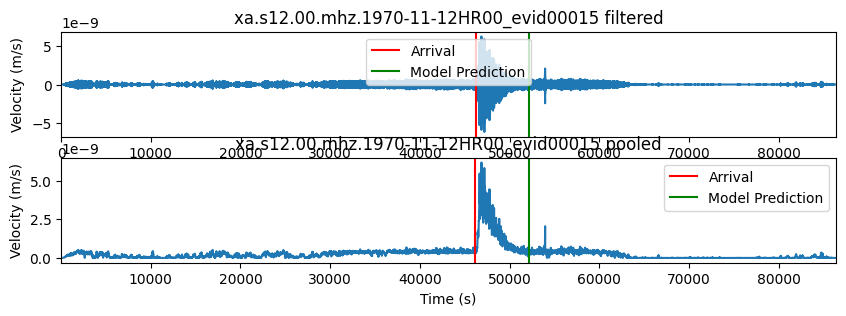

Predicted Time: 68392.30188679245
Actual Time: 26520.0
Predicted Index: 4530
Loss: 5.682183265686035



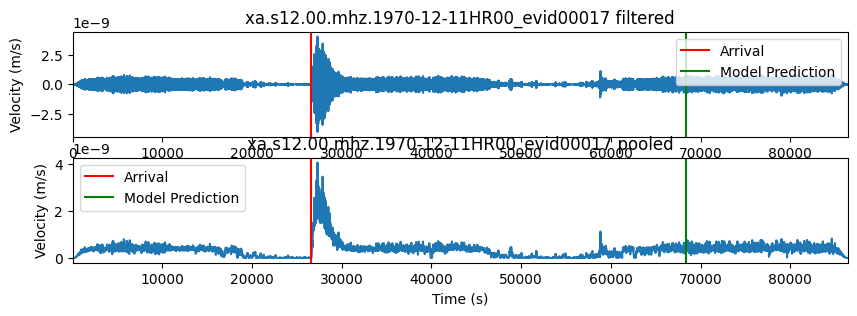

Predicted Time: 72045.1320754717
Actual Time: 74040.0
Predicted Index: 4772
Loss: 5.905483245849609



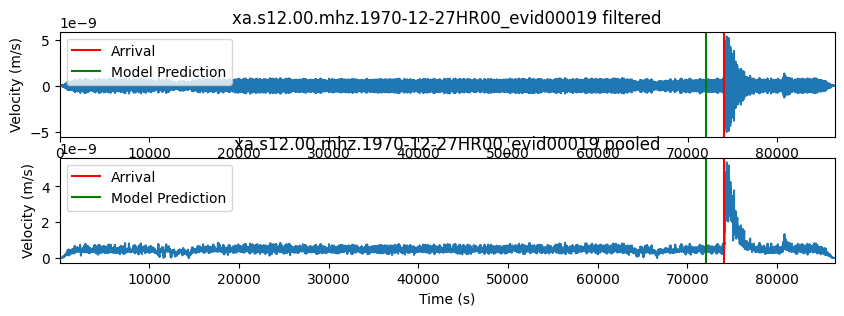

Predicted Time: 18354.56603773585
Actual Time: 56460.0
Predicted Index: 1215
Loss: 6.148305416107178



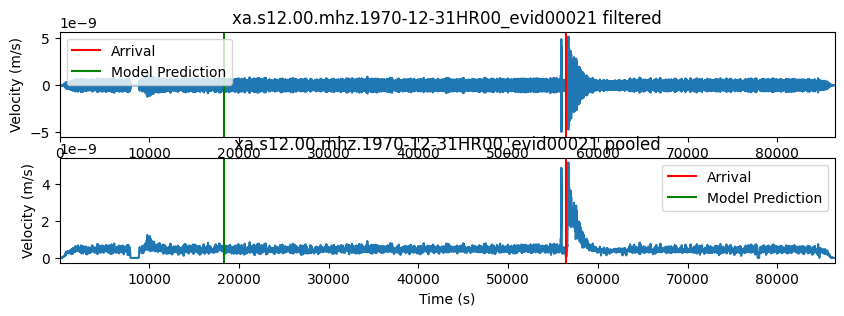

Predicted Time: 42233.81132075472
Actual Time: 45600.0
Predicted Index: 2797
Loss: 6.480808258056641



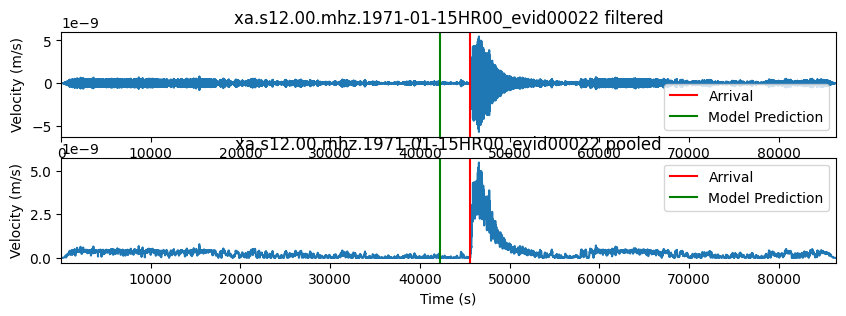

Predicted Time: 71818.71698113208
Actual Time: 53940.0
Predicted Index: 4757
Loss: 7.350412368774414



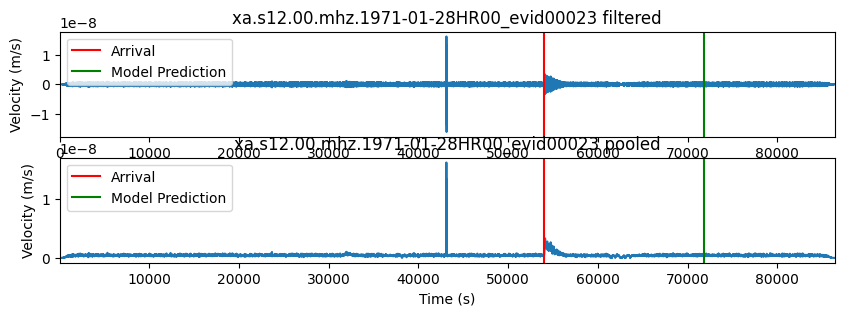

Predicted Time: 71818.71698113208
Actual Time: 66060.0
Predicted Index: 4757
Loss: 7.959305286407471



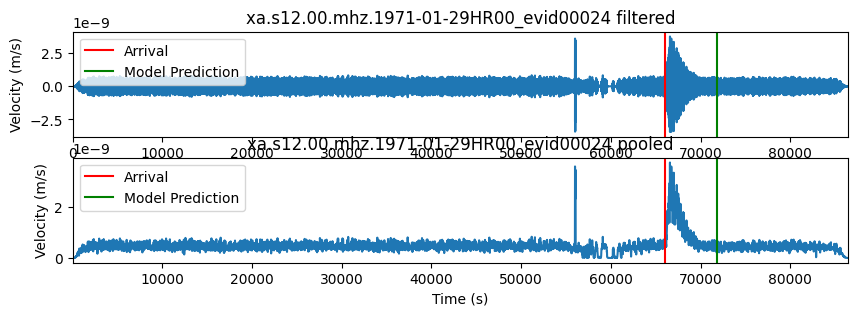

Predicted Time: 41448.90566037736
Actual Time: 13320.0
Predicted Index: 2745
Loss: 8.092910766601562



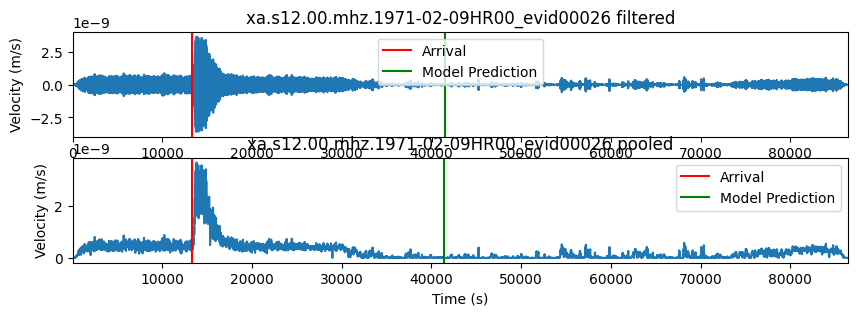

Predicted Time: 46188.52830188679
Actual Time: 55080.0
Predicted Index: 3059
Loss: 8.084750175476074



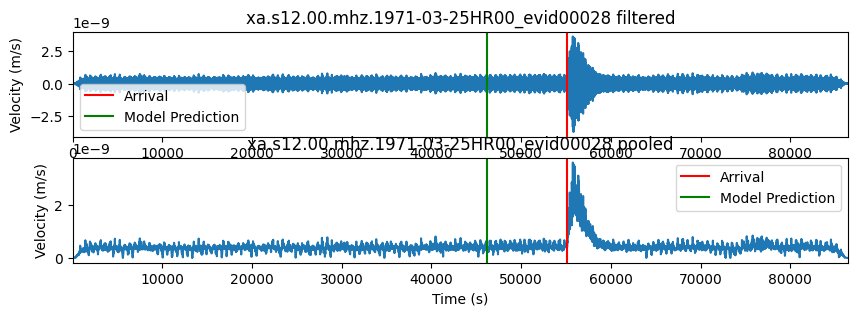

File not found: ../nasa_space_apps/demo/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1971-04-13HR00_evid00029.csv
Predicted Time: 46188.52830188679
Actual Time: 25440.0
Predicted Index: 3059
Loss: 7.939605712890625



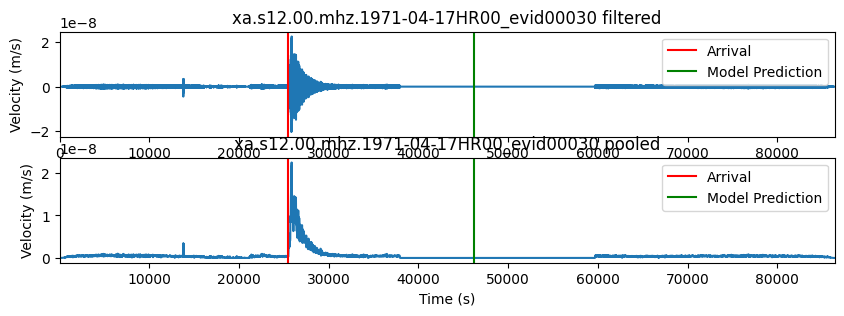

Predicted Time: 74037.58490566038
Actual Time: 29100.0
Predicted Index: 4904
Loss: 7.947566509246826



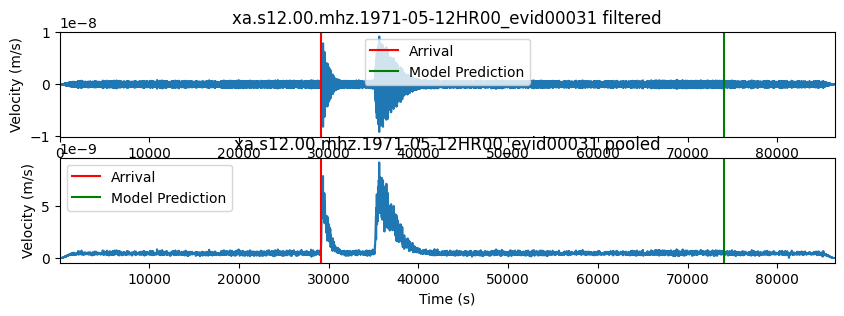

Predicted Time: 74037.58490566038
Actual Time: 35100.0
Predicted Index: 4904
Loss: 7.802420616149902



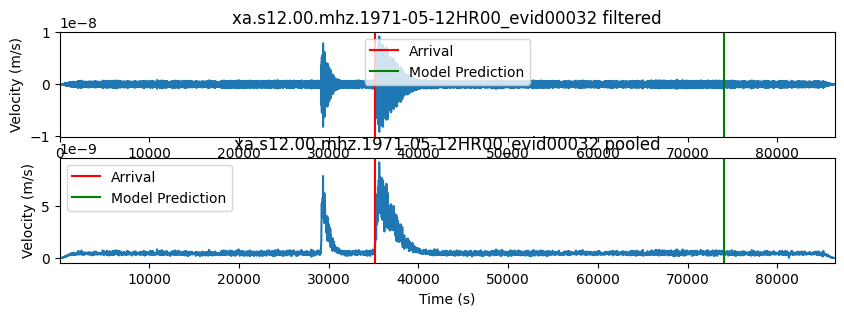

Predicted Time: 56452.67924528302
Actual Time: 10800.0
Predicted Index: 3739
Loss: 7.681995391845703



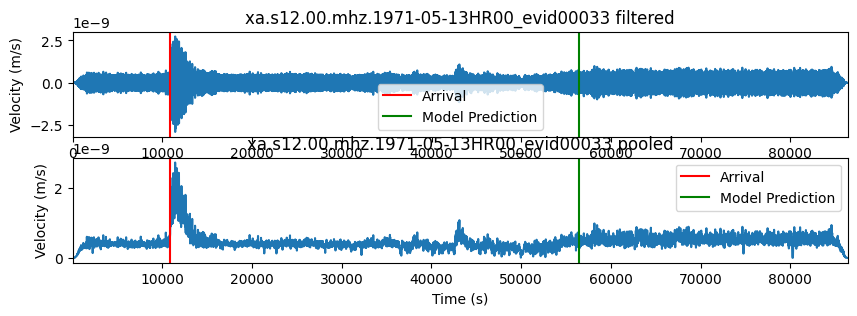

Predicted Time: 53931.92452830189
Actual Time: 80400.0
Predicted Index: 3572
Loss: 7.585559844970703



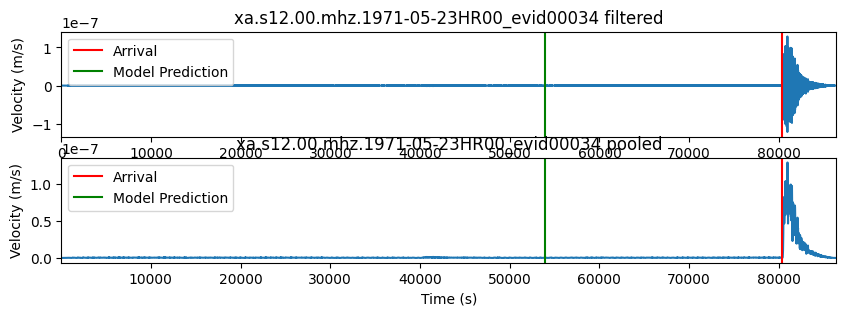

Predicted Time: 53931.92452830189
Actual Time: 39060.0
Predicted Index: 3572
Loss: 7.331978797912598



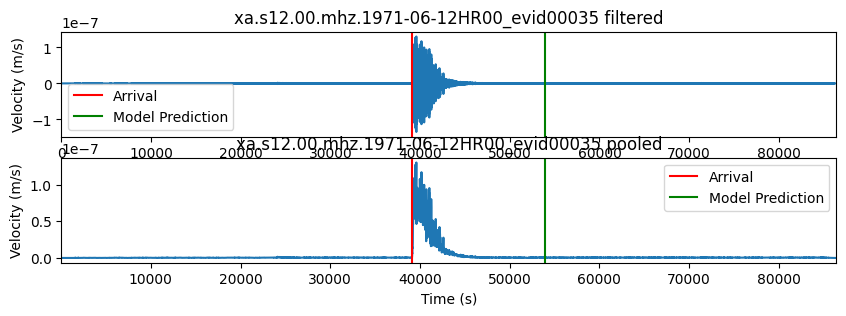

Predicted Time: 66052.67924528301
Actual Time: 19800.0
Predicted Index: 4375
Loss: 7.09194278717041



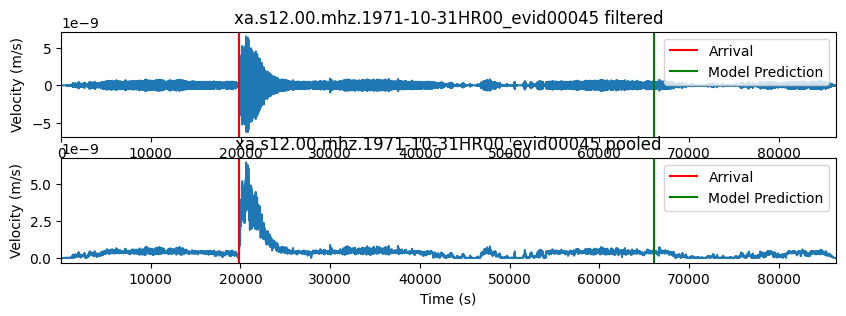

Predicted Time: 13313.056603773584
Actual Time: 23700.0
Predicted Index: 881
Loss: 6.852006912231445



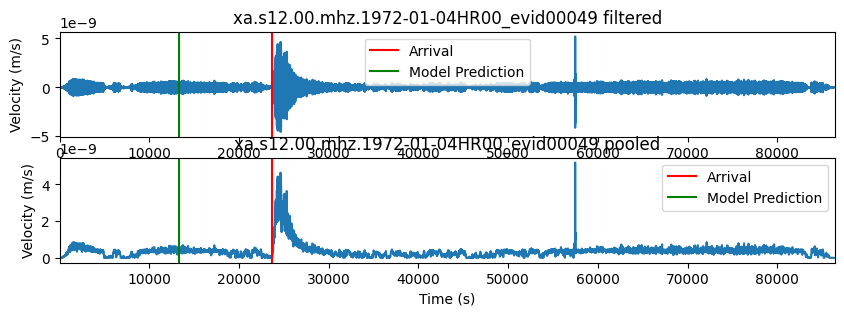

Predicted Time: 13313.056603773584
Actual Time: 8580.0
Predicted Index: 881
Loss: 6.718403339385986



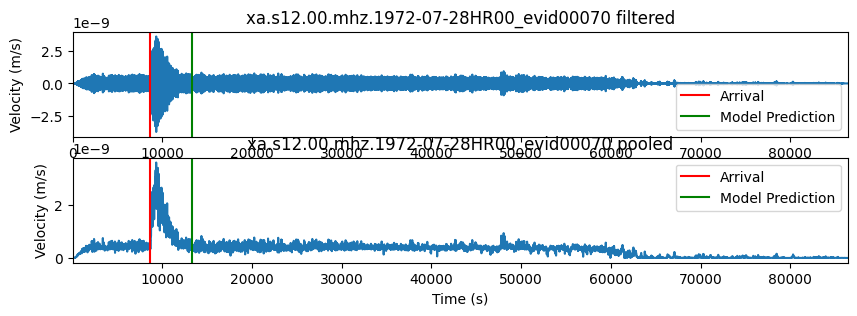

Predicted Time: 25433.81132075472
Actual Time: 65280.0
Predicted Index: 1684
Loss: 6.838257789611816



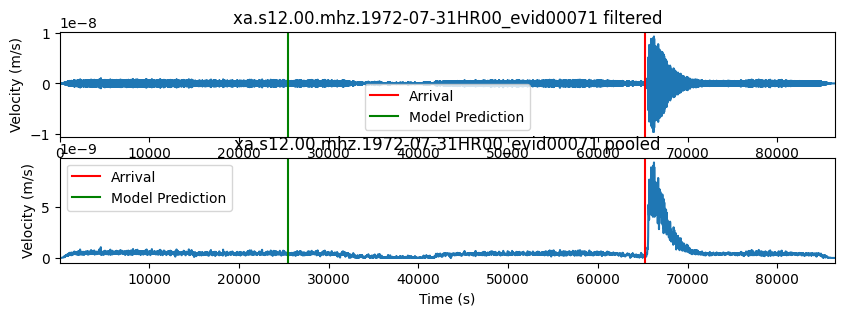

Predicted Time: 25433.81132075472
Actual Time: 82860.0
Predicted Index: 1684
Loss: 6.887190818786621



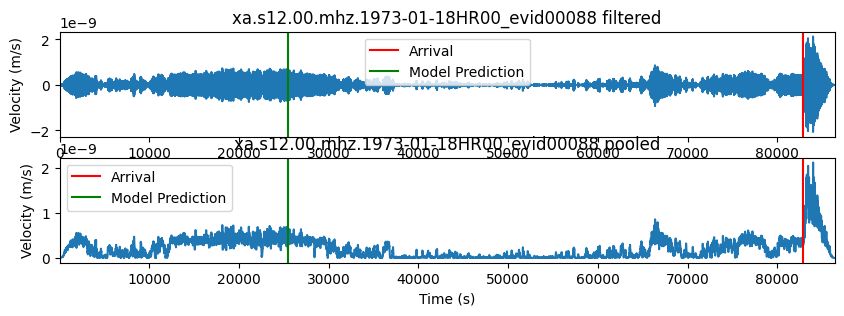

Predicted Time: 35094.188679245286
Actual Time: 2640.0
Predicted Index: 2324
Loss: 6.824695587158203



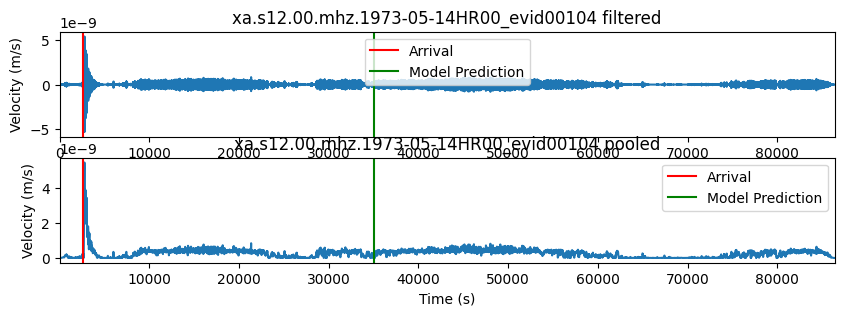

Predicted Time: 10792.301886792451
Actual Time: 6120.0
Predicted Index: 714
Loss: 6.638792037963867



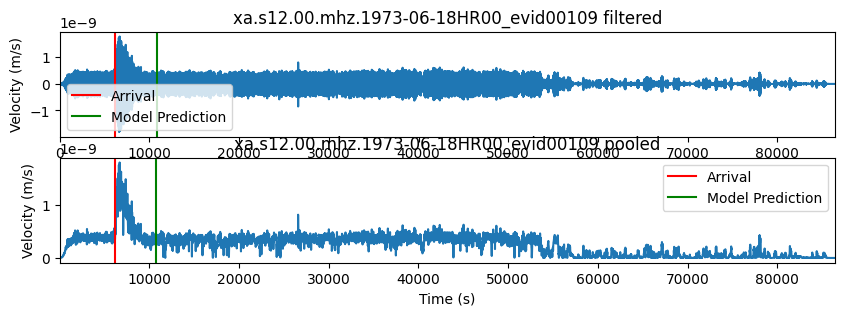

Predicted Time: 39048.90566037736
Actual Time: 68520.0
Predicted Index: 2586
Loss: 6.398796081542969



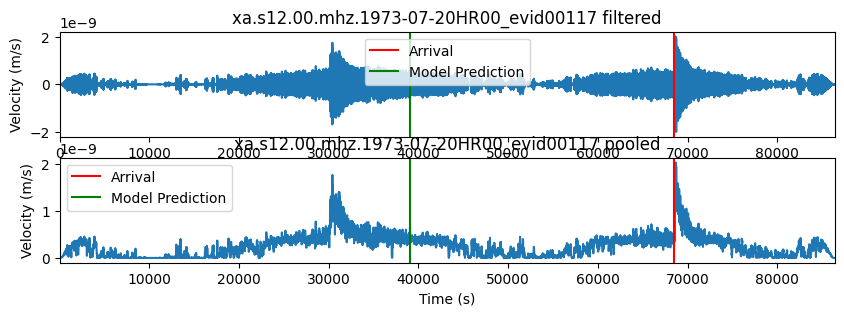

Predicted Time: 19788.528301886792
Actual Time: 44220.0
Predicted Index: 1310
Loss: 6.064096927642822



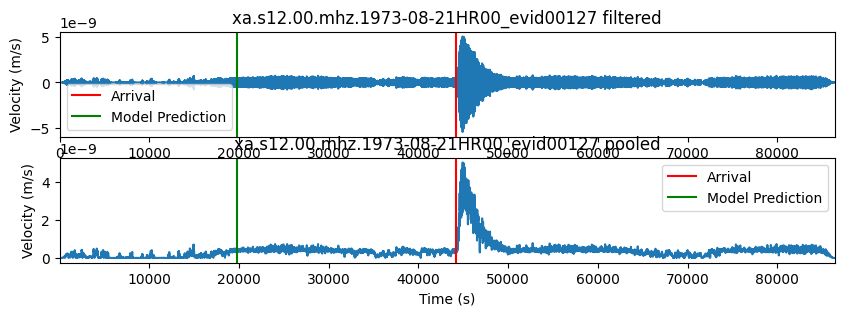

Predicted Time: 23697.962264150945
Actual Time: 84060.0
Predicted Index: 1569
Loss: 5.849117755889893



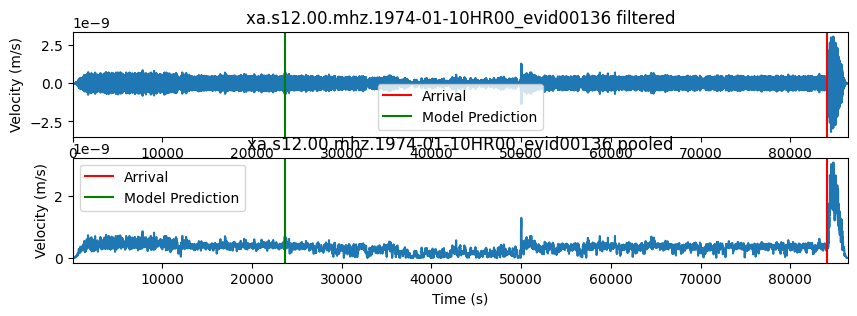

Predicted Time: 23697.962264150945
Actual Time: 22860.0
Predicted Index: 1569
Loss: 5.736920356750488



KeyboardInterrupt: 

In [6]:
data_folder = "../nasa_space_apps/demo/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/training/data/S12_GradeA/"

epoch = 20

# Loss function and optimizer
loss_fn = nn.CrossEntropyLoss()  # CrossEntropyLoss expects target to be LongTensor, not one-hot encoded
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

for i in range(epoch):
    running_loss = 0.0

    catalog_df = read_catalog()

    for _, row in catalog_df.iterrows():
        time_rel = row['time_rel(sec)']
        filename = row['filename']

        try:
            # Ensure the path is properly joined
            file_path = os.path.join(data_folder, f'{filename}.csv')
            event_df = pd.read_csv(file_path)

            time = np.array(event_df['time_rel(sec)'].tolist())
            velocity = np.array(event_df['velocity(m/s)'].tolist())
        except FileNotFoundError:
            print(f"File not found: {file_path}")
            continue
        except Exception as e:
            print(f"Error reading file {file_path}: {e}")
            continue

        # Filtering and pooling
        velocity_filtered = butter_bandpass_filter(velocity, 0.5, 1.0, 6.0)
        data_pooled = max_pool_1d(np.vstack((velocity_filtered, time)), 100)
        
        if data_pooled.shape[1] != 5725:
            continue

        velocity_pooled = data_pooled[0, :].flatten()
        time_pooled = data_pooled[1, :].flatten()

        X = torch.tensor(velocity_pooled).to(torch.float32).unsqueeze(0).to(device)
        y = torch.tensor(one_hot_encode(5725, find_nearest_time_index(time_pooled, time_rel))).to(torch.float32).to(device)        

        index = torch.argmax(output).item()
        predicted_time = time_pooled[index]

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        output = model(X)

        # Compute loss
        loss = loss_fn(output, y)
        loss.backward()
        optimizer.step()

        # Print results
        print(f"Predicted Time: {predicted_time}")
        print(f"Actual Time: {time_rel}")
        print(f"Predicted Index: {index}")
        print(f"Loss: {loss.item()}\n")

"""
        # Plot results
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 3))
        plt.rcParams['keymap.quit'].append(' ')

        plot(f'{filename} filtered', ax1, time, velocity_filtered, time_rel, predicted_time)
        plot(f'{filename} pooled', ax2, time_pooled, velocity_pooled, time_rel, predicted_time)

        plt.show()
        """

12226.264150943396
tensor(2880)
tensor(809)
4.883955001831055


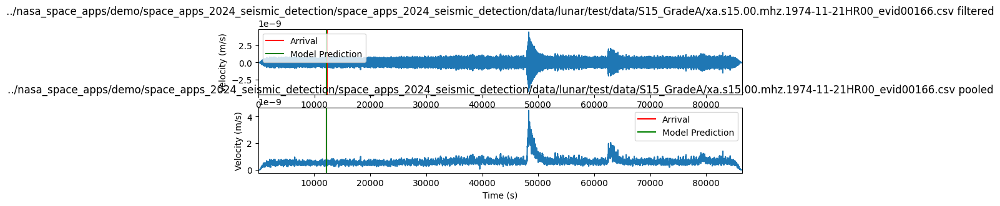

In [ ]:
filename = "../nasa_space_apps/demo/space_apps_2024_seismic_detection/space_apps_2024_seismic_detection/data/lunar/test/data/S15_GradeA/xa.s15.00.mhz.1974-11-21HR00_evid00166.csv"

event_df = pd.read_csv(filename)

time = np.array(event_df['time_rel(sec)'].tolist())
velocity = np.array(event_df['velocity(m/s)'].tolist())

velocity_filtered = butter_bandpass_filter(velocity, 0.5, 1.0, 6.0)

data_pooled = max_pool_1d(np.vstack((velocity_filtered, time)), 100)

velocity_pooled = data_pooled[0:1, :].flatten()
time_pooled = data_pooled[1:2, :].flatten()

data = torch.tensor(velocity_pooled).type(torch.float32).unsqueeze(0)
label = torch.tensor(one_hot_encode(5725, find_nearest_time_index(time_pooled, time_rel))).type(torch.float32)

output = model(data)

predicted_time = time_pooled[torch.argmax(label).item()]
print(predicted_time)

print(torch.argmax(output))
print(torch.argmax(label))
print(loss.item())

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 3))
plt.rcParams['keymap.quit'].append(' ')

plot(f'{filename} filtered', ax1, time, velocity_filtered, time_rel, predicted_time)
plot(f'{filename} pooled', ax2, time_pooled, velocity_pooled, time_rel, predicted_time)

plt.show()
